### Student Information
Name: 黃景焌

Student ID: 113401910

GitHub ID: MacroHubber

---

### Instructions

1. First: do the **take home** exercises in the [DM2024-Lab1-Master](https://github.com/didiersalazar/DM2024-Lab1-Master.git). You may need to copy some cells from the Lab notebook to this notebook. __This part is worth 20% of your grade.__


2. Second: follow the same process from the [DM2024-Lab1-Master](https://github.com/didiersalazar/DM2024-Lab1-Master.git) on **the new dataset**. You don't need to explain all details as we did (some **minimal comments** explaining your code are useful though).  __This part is worth 30% of your grade.__
    - Download the [the new dataset](https://huggingface.co/datasets/Senem/Nostalgic_Sentiment_Analysis_of_YouTube_Comments_Data). The dataset contains a `sentiment` and `comment` columns, with the sentiment labels being: 'nostalgia' and 'not nostalgia'. Read the specificiations of the dataset for background details. 
    - You are allowed to use and modify the `helper` functions in the folder of the first lab session (notice they may need modification) or create your own.


3. Third: please attempt the following tasks on **the new dataset**. __This part is worth 30% of your grade.__
    - Generate meaningful **new data visualizations**. Refer to online resources and the Data Mining textbook for inspiration and ideas. 
    - Generate **TF-IDF features** from the tokens of each text. This will generating a document matrix, however, the weights will be computed differently (using the TF-IDF value of each word per document as opposed to the word frequency). Refer to this Scikit-learn [guide](http://scikit-learn.org/stable/modules/generated/sklearn.feature_extraction.text.TfidfVectorizer.html) .
    - Implement a simple **Naive Bayes classifier** that automatically classifies the records into their categories. Use both the TF-IDF features and word frequency features to build two seperate classifiers. Note that for the TF-IDF features you might need to use other type of NB classifier different than the one in the Master Notebook. Comment on the differences.  Refer to this [article](https://hub.packtpub.com/implementing-3-naive-bayes-classifiers-in-scikit-learn/).


4. Fourth: In the lab, we applied each step really quickly just to illustrate how to work with your dataset. There are somethings that are not ideal or the most efficient/meaningful. Each dataset can be handled differently as well. What are those inefficent parts you noticed? How can you improve the Data preprocessing for these specific datasets? __This part is worth 10% of your grade.__


5. Fifth: It's hard for us to follow if your code is messy, so please **tidy up your notebook** and **add minimal comments where needed**. __This part is worth 10% of your grade.__


You can submit your homework following these guidelines: [Git Intro & How to hand your homework](https://github.com/didiersalazar/DM2024-Lab1-Master/blob/main/Git%20Intro%20%26%20How%20to%20hand%20your%20homework.ipynb). Make sure to commit and save your changes to your repository __BEFORE the deadline (October 27th 11:59 pm, Sunday)__. 

In [5]:
### Begin Assignment Here

In [ ]:
**Please note that I have copied all the exercises for the take-home exercises from the Master file here as well. The exercises for the new data set can be found starting from the header labelled "New Dataset begins below"**

In [6]:
# categories
categories = ['alt.atheism', 'soc.religion.christian', 'comp.graphics', 'sci.med']

In [7]:
# obtain the documents containing the categories provided
from sklearn.datasets import fetch_20newsgroups

twenty_train = fetch_20newsgroups(subset='train', categories=categories,
                                  shuffle=True, random_state=42) 
#This command also shuffles the data randomly, but with random_state we can bring the same distribution of data everytime 
#if we choose the same number, in this case "42". This is good for us, it means we can reproduce the same results every time
#we want to run the code.

### **>>> Exercise 1 (Watch Video):**  
In this exercise, please print out the *text* data for the first three samples in the dataset. (See the above code for help)

In [9]:
for t in twenty_train.target[:3]:
    print(twenty_train.target_names[t])

comp.graphics
comp.graphics
soc.religion.christian


In [10]:
import pandas as pd

# my functions
import helpers.data_mining_helpers as dmh

# construct dataframe from a list
X = pd.DataFrame.from_records(dmh.format_rows(twenty_train), columns= ['text'])

In [11]:
# add category to the dataframe
X['category'] = twenty_train.target

# add category label also
X['category_name'] = X.category.apply(lambda t: dmh.format_labels(t, twenty_train))

### **>>> Exercise 2 (take home):** 
Experiment with other querying techniques using pandas dataframes. Refer to their [documentation](https://pandas.pydata.org/pandas-docs/stable/indexing.html) for more information. 

In [13]:
# using .iat as an alternative to .iloc (0-based indexing) to obtain category_name of 10th row
X.iat[9, 2]

'sci.med'

In [14]:
# using .at as an alt to loc (label indexing) to obtain category_name of 10th row
X.at[9, 'category_name']

'sci.med'

### **>>> Exercise 3 (Watch Video):**  
Try to fetch records belonging to the ```sci.med``` category, and query every 10th record. Only show the first 5 records.

In [16]:
sci_med_records = X[X['category_name'] == 'sci.med']
every_10th_record = sci_med_records.iloc[::10]
first_5_records = every_10th_record.head(5)
first_5_records

,text,category,category_name
7,From: aldridge@netcom.com (Jacquelin Aldridge)...,2,sci.med
49,From: jimj@contractor.EBay.Sun.COM (Jim Jones)...,2,sci.med
82,From: jason@ab20.larc.nasa.gov (Jason Austin) ...,2,sci.med
118,From: rogers@calamari.hi.com (Andrew Rogers) S...,2,sci.med
142,From: lady@uhunix.uhcc.Hawaii.Edu (Lee Lady) S...,2,sci.med


### >>> **Exercise 4 (Watch Video):** 
Let's try something different. Instead of calculating missing values by column let's try to calculate the missing values in every record instead of every column.  
$Hint$ : `axis` parameter. Check the documentation for more information.

In [18]:
X.isnull().apply(lambda x: dmh.check_missing_values(x), axis=1)

0       (The amoung of missing records is: , 0)
1       (The amoung of missing records is: , 0)
2       (The amoung of missing records is: , 0)
3       (The amoung of missing records is: , 0)
4       (The amoung of missing records is: , 0)
                         ...                   
2252    (The amoung of missing records is: , 0)
2253    (The amoung of missing records is: , 0)
2254    (The amoung of missing records is: , 0)
2255    (The amoung of missing records is: , 0)
2256    (The amoung of missing records is: , 0)
Length: 2257, dtype: object

### >>> **Exercise 5 (take home)** 
There is an old saying that goes, "The devil is in the details." When we are working with extremely large data, it's difficult to check records one by one (as we have been doing so far). And also, we don't even know what kind of missing values we are facing. Thus, "debugging" skills get sharper as we spend more time solving bugs. Let's focus on a different method to check for missing values and the kinds of missing values you may encounter. It's not easy to check for missing values as you will find out in a minute.

Please check the data and the process below, describe what you observe and why it happened.   
$Hint$ :  why `.isnull()` didn't work?

In [20]:
import numpy as np

NA_dict = [{ 'id': 'A', 'missing_example': np.nan },
           { 'id': 'B'                    },
           { 'id': 'C', 'missing_example': 'NaN'  },
           { 'id': 'D', 'missing_example': 'None' },
           { 'id': 'E', 'missing_example':  None  },
           { 'id': 'F', 'missing_example': ''     }]

NA_df = pd.DataFrame(NA_dict, columns = ['id','missing_example'])
NA_df

,id,missing_example
0,A,NaN
1,B,NaN
2,C,NaN
3,D,None
4,E,None
5,F,


In [21]:
NA_df['missing_example'].isnull() # check which rows are actually null values

0     True
1     True
2    False
3    False
4     True
5    False
Name: missing_example, dtype: bool

We can see that although visually all records appear to contain a 'null' or 'NaN' value, further looking into the dictionary allows us further clarity

Row 1: Stored as np.nan in the dictionary, which is how NumPy represents NaN, hence is a True example of missing value

Row 2: No value is assigned in the dictionary at all, hence it is a True example of missing value

Row 3: Contains a string called 'NaN', which is a value and hence False example of NaN (or missing value)

Row 4: Again, contains a string called 'None' and hence False example of NaN

Row 5: Much like Row 1, represents NaN in pandas as it is recognised as null value in Python

Row 6: It is an empty string, and hence not considered a missing value


### >>> Exercise 6 (take home):
Notice any changes from the `X` dataframe to the `X_sample` dataframe? What are they? Report every change you noticed as compared to the previous state of `X`. Feel free to query and look more closely at the dataframe for these changes.

In [24]:
X_sample = X.sample(n=1000) #random state

In [25]:
X_sample

,text,category,category_name
458,From: 18669@bach.udel.edu (Steven R Hoskins) S...,3,soc.religion.christian
251,From: marka@hcx1.ssd.csd.harris.com (Mark Ashl...,3,soc.religion.christian
1419,From: MCAVALCANTI%VORTEX.UFRGS.BR@UICVM.UIC.ED...,1,comp.graphics
866,From: rjb@akgua.att.com Subject: Re: When are ...,3,soc.religion.christian
779,From: mussack@austin.ibm.com (Chris Mussack) S...,3,soc.religion.christian
...,...,...,...
2090,From: cliff@buster.stafford.tx.us (Cliff Tompl...,2,sci.med
139,From: hrubin@pop.stat.purdue.edu (Herman Rubin...,2,sci.med
2095,From: nigel.allen@canrem.com (Nigel Allen) Sub...,3,soc.religion.christian
120,From: ray@engr.LaTech.edu (Bill Ray) Subject: ...,0,alt.atheism


In [26]:
X

,text,category,category_name
0,From: sd345@city.ac.uk (Michael Collier) Subje...,1,comp.graphics
1,From: ani@ms.uky.edu (Aniruddha B. Deglurkar) ...,1,comp.graphics
2,From: djohnson@cs.ucsd.edu (Darin Johnson) Sub...,3,soc.religion.christian
3,From: s0612596@let.rug.nl (M.M. Zwart) Subject...,3,soc.religion.christian
4,From: stanly@grok11.columbiasc.ncr.com (stanly...,3,soc.religion.christian
...,...,...,...
2252,From: roos@Operoni.Helsinki.FI (Christophe Roo...,2,sci.med
2253,From: mhollowa@ic.sunysb.edu (Michael Holloway...,2,sci.med
2254,From: sasghm@theseus.unx.sas.com (Gary Merrill...,2,sci.med
2255,From: Dan Wallach <dwallach@cs.berkeley.edu> S...,2,sci.med


Several differences are immediately clear:

1. X remains unchanged as the original dataframe with 2257 rows, while X_sample consists of a randomly selected set of 1000 rows as no seed is specified
2. The index numbering for X_sample does not start from 0 unlike X
3. The index numbering does not count up starting from 0 sequentially, nor does it follow any ordering from largest to smallest or vice versa

In [28]:
import matplotlib.pyplot as plt
%matplotlib inline

category_name
soc.religion.christian    599
sci.med                   594
comp.graphics             584
alt.atheism               480
Name: count, dtype: int64


<Axes: title={'center': 'Category distribution'}, xlabel='category_name'>

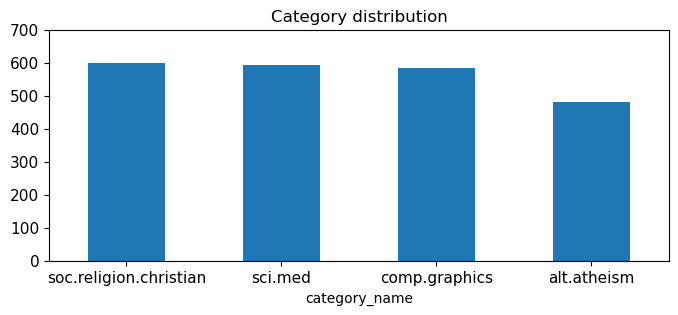

In [29]:
print(X.category_name.value_counts())

# plot barchart for X
X.category_name.value_counts().plot(kind = 'bar',
                                    title = 'Category distribution',
                                    ylim = [0, 700],        
                                    rot = 0, fontsize = 11, figsize = (8,3))

category_name
soc.religion.christian    266
comp.graphics             259
sci.med                   247
alt.atheism               228
Name: count, dtype: int64


<Axes: title={'center': 'Category distribution'}, xlabel='category_name'>

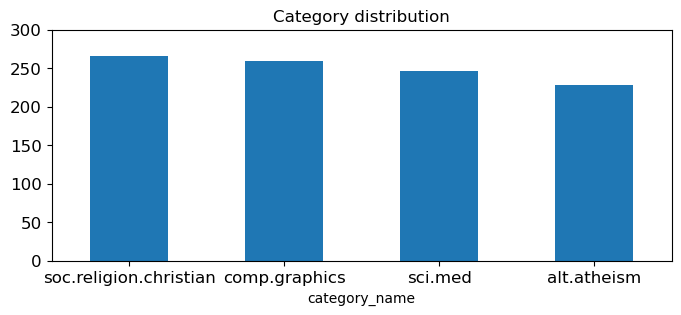

In [30]:
print(X_sample.category_name.value_counts())

# plot barchart for X_sample
X_sample.category_name.value_counts().plot(kind = 'bar',
                                           title = 'Category distribution',
                                           ylim = [0, 300], 
                                           rot = 0, fontsize = 12, figsize = (8,3))

### >>> **Exercise 7 (Watch Video):**
Notice that for the `ylim` parameters we hardcoded the maximum value for y. Is it possible to automate this instead of hard-coding it? How would you go about doing that? (Hint: look at code above for clues)

<Axes: title={'center': 'Category distribution'}, xlabel='category_name'>

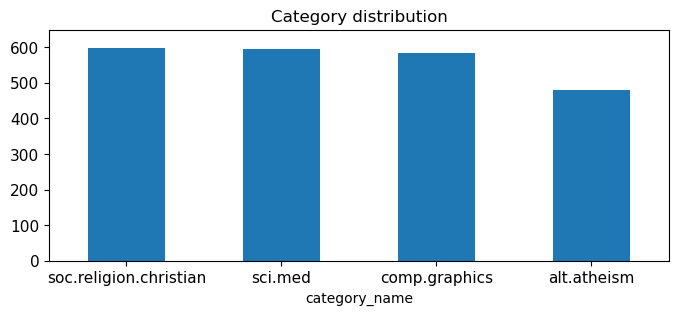

In [32]:
category_count = X.category_name.value_counts()
category_count

# plot barchart for X
X.category_name.value_counts().plot(kind = 'bar',
                                    title = 'Category distribution',
                                    ylim = [0, category_count.max() + 50],  ## .max() obtains maximum count out of all categories, then adds a constant +50 y-axis buffer to ensure better presentation  
                                    rot = 0, fontsize = 11, figsize = (8,3))

### >>> **Exercise 8 (take home):** 
We can also do a side-by-side comparison of the distribution between the two datasets, but maybe you can try that as an excerise. Below we show you an snapshot of the type of chart we are looking for. 

<Axes: title={'center': 'Category Distribution: X vs. X_sample'}, xlabel='category_name'>

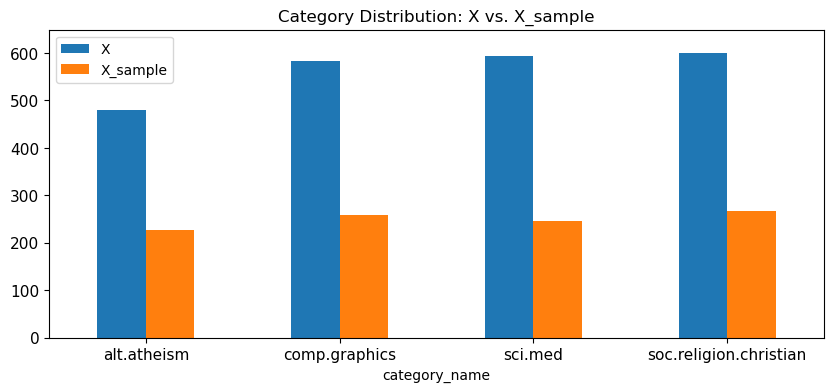

In [34]:
category_count = X.category_name.value_counts()
category_count_X_sample = X_sample.category_name.value_counts()

comparison_df = pd.DataFrame({   # Combines both counts into single df
    'X': category_count,
    'X_sample': category_count_X_sample})

# plot barchart for X
comparison_df.plot(kind='bar',
                   title='Category Distribution: X vs. X_sample',
                   ylim=[0, max(category_count.max(), category_count_X_sample.max()) + 50],  # Dynamically set y-axis based on max of both
                   rot=0, fontsize=11, figsize=(10, 4))

### **>>> Exercise 9 (Watch Video):**
Let's analyze the first record of our X dataframe with the new analyzer we have just built. Go ahead try it!

In [36]:
import nltk

In [37]:
# takes a like a minute or two to process
X['unigrams'] = X['text'].apply(lambda x: dmh.tokenize_text(x))

In [38]:
from sklearn.feature_extraction.text import CountVectorizer

count_vect = CountVectorizer()
X_counts = count_vect.fit_transform(X.text) #learn the vocabulary and return document-term matrix
print(X_counts[0])

  (0, 14887)	1
  (0, 29022)	1
  (0, 8696)	4
  (0, 4017)	2
  (0, 33256)	2
  (0, 21661)	3
  (0, 9031)	3
  (0, 31077)	1
  (0, 9805)	2
  (0, 17366)	1
  (0, 32493)	4
  (0, 16916)	2
  (0, 19780)	2
  (0, 17302)	2
  (0, 23122)	1
  (0, 25663)	1
  (0, 16881)	1
  (0, 16082)	1
  (0, 23915)	1
  (0, 32142)	5
  (0, 33597)	2
  (0, 20253)	1
  (0, 587)	1
  (0, 12051)	1
  (0, 5201)	1
  :	:
  (0, 25361)	1
  (0, 25337)	1
  (0, 12833)	2
  (0, 5195)	1
  (0, 27836)	1
  (0, 18474)	1
  (0, 32270)	1
  (0, 9932)	1
  (0, 15837)	1
  (0, 32135)	1
  (0, 17556)	1
  (0, 4378)	1
  (0, 26175)	1
  (0, 9338)	1
  (0, 33572)	1
  (0, 31915)	1
  (0, 177)	2
  (0, 2326)	2
  (0, 3062)	1
  (0, 35416)	1
  (0, 20459)	1
  (0, 14085)	1
  (0, 3166)	1
  (0, 12541)	1
  (0, 230)	1


In [39]:
analyze = count_vect.build_analyzer()
analyze(X['text'][0])

['from',
 'sd345',
 'city',
 'ac',
 'uk',
 'michael',
 'collier',
 'subject',
 'converting',
 'images',
 'to',
 'hp',
 'laserjet',
 'iii',
 'nntp',
 'posting',
 'host',
 'hampton',
 'organization',
 'the',
 'city',
 'university',
 'lines',
 '14',
 'does',
 'anyone',
 'know',
 'of',
 'good',
 'way',
 'standard',
 'pc',
 'application',
 'pd',
 'utility',
 'to',
 'convert',
 'tif',
 'img',
 'tga',
 'files',
 'into',
 'laserjet',
 'iii',
 'format',
 'we',
 'would',
 'also',
 'like',
 'to',
 'do',
 'the',
 'same',
 'converting',
 'to',
 'hpgl',
 'hp',
 'plotter',
 'files',
 'please',
 'email',
 'any',
 'response',
 'is',
 'this',
 'the',
 'correct',
 'group',
 'thanks',
 'in',
 'advance',
 'michael',
 'michael',
 'collier',
 'programmer',
 'the',
 'computer',
 'unit',
 'email',
 'collier',
 'uk',
 'ac',
 'city',
 'the',
 'city',
 'university',
 'tel',
 '071',
 '477',
 '8000',
 'x3769',
 'london',
 'fax',
 '071',
 '477',
 '8565',
 'ec1v',
 '0hb']

### **>>> Exercise 10 (take home):**
We said that the `1` at the beginning of the fifth record represents the `00` term. Notice that there is another 1 in the same record. Can you provide code that can verify what word this 1 represents from the vocabulary. Try to do this as efficient as possible.

In [41]:
feature_names = count_vect.get_feature_names_out()

# find the words corresponding to each '1'
for row_idx, row in enumerate(X_counts[0:5, 0:100].toarray()):
    # Find indices where '1' appears
    word_indices = np.where(row == 1)[0]
    words = [feature_names[i] for i in word_indices]
    print(f"Row {row_idx} words:", words)

Row 0 words: []
Row 1 words: []
Row 2 words: []
Row 3 words: []
Row 4 words: ['00', '01']


### **>>> Exercise 11 (take home):** 
From the chart above, we can see how sparse the term-document matrix is; i.e., there is only one terms with **FREQUENCY** of `1` in the subselection of the matrix. By the way, you may have noticed that we only selected 20 articles and 20 terms to plot the histrogram. As an excersise you can try to modify the code above to plot the entire term-document matrix or just a sample of it. How would you do this efficiently? Remember there is a lot of words in the vocab. Report below what methods you would use to get a nice and useful visualization

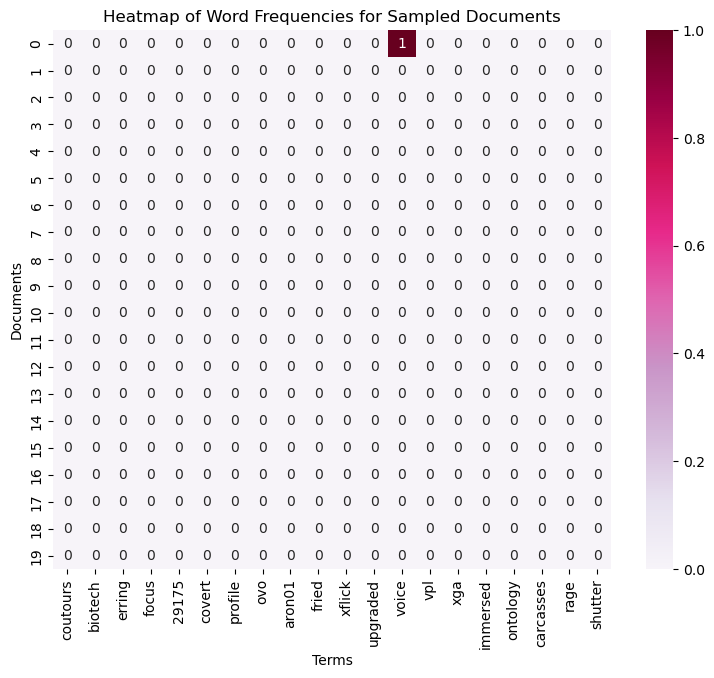

In [43]:
import seaborn as sns

# Randomly select 20 documents (rows) and 20 terms (columns)
num_rows = 20
num_cols = 20
random_rows = np.random.choice(X_counts.shape[0], num_rows, replace=False)
random_cols = np.random.choice(X_counts.shape[1], num_cols, replace=False)

# Convert the selected rows and columns to a dense array
selected_data = X_counts[random_rows, :][:, random_cols].toarray()

# Get the corresponding feature names (terms)
selected_terms = count_vect.get_feature_names_out()[random_cols]

# Create a df for visualization
df_todraw = pd.DataFrame(selected_data, columns=selected_terms)

# Plot the heatmap
plt.subplots(figsize=(9, 7))
ax = sns.heatmap(df_todraw, cmap="PuRd", annot=True)
plt.title('Heatmap of Word Frequencies for Sampled Documents')
plt.xlabel('Terms')
plt.ylabel('Documents')
plt.show()

The above allows us to visualise the frequency of a set of randomly selected 20 terms amongst 20 randomly selected documents i.e. random sampling of both axes.

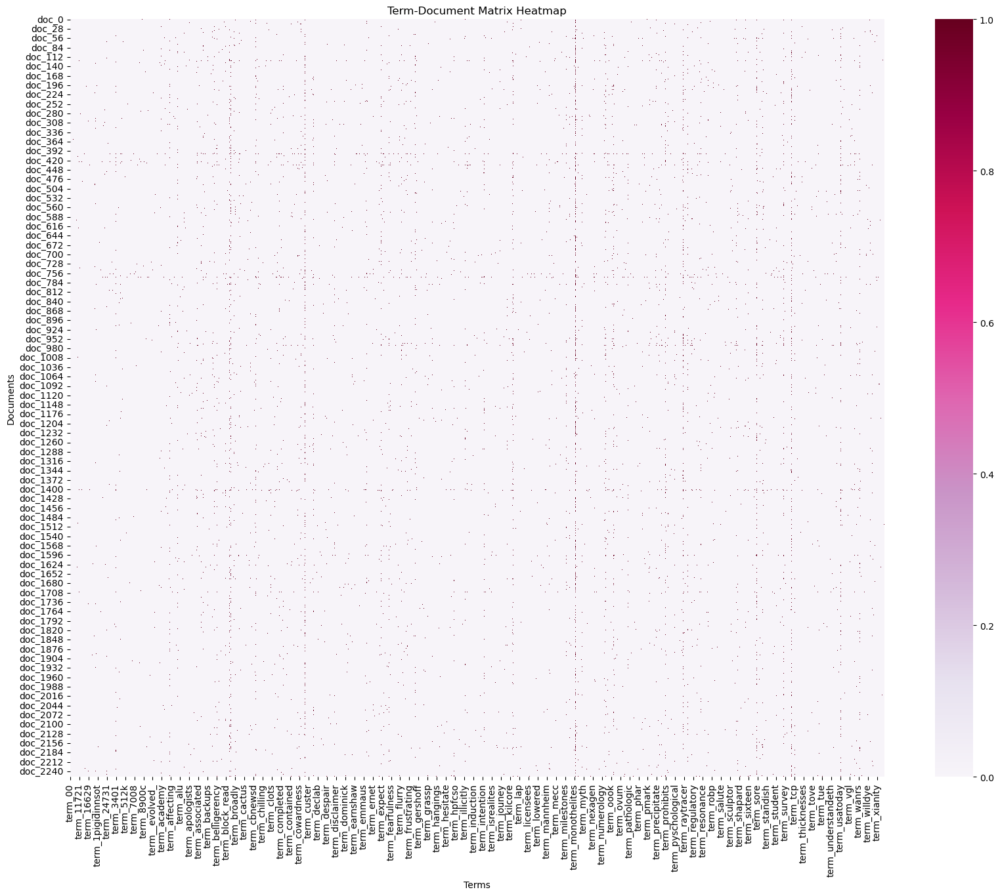

In [45]:
plot_x = ["term_" + str(i) for i in count_vect.get_feature_names_out()]  # All terms
plot_y = ["doc_" + str(i) for i in list(X.index)]  # All documents
plot_z = X_counts.toarray()  # Entire term-document matrix

import seaborn as sns
import matplotlib.pyplot as plt

# Create a df for the heatmap
df_todraw = pd.DataFrame(plot_z, columns=plot_x, index=plot_y)

# Set up the plot size based on the dimensions of the matrix
plt.subplots(figsize=(20, 15))  # Adjust the figure size as needed
ax = sns.heatmap(df_todraw,
                 cmap="PuRd",
                 vmin=0, vmax=1,  # Adjust vmin and vmax based on your data
                 annot=False)  # Set annot=True if you want to show the counts in the cells
plt.title('Term-Document Matrix Heatmap')
plt.xlabel('Terms')
plt.ylabel('Documents')
plt.show()


Alternatively, the above code also allows for a heatmap of the entire term document matrix accounting for all words across all documents. Though interesting, it would also require the ability to zoom in to specific portions of the heatmap, or a large enough screen to display it to draw any meaningful analysis out of it.

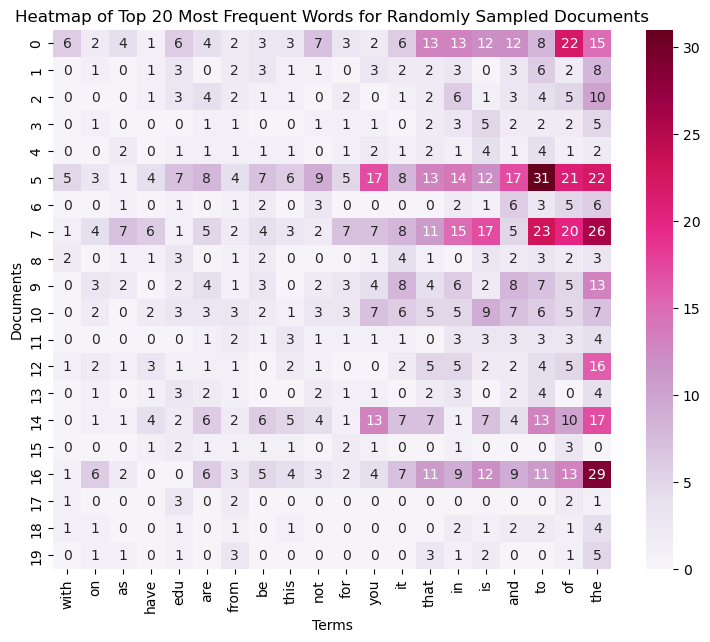

In [47]:
# Calculate the sum of each term across all documents to get the frequencies
term_frequencies = X_counts.sum(axis=0).A1  # Convert from sparse matrix to array

# Get the indices of the top 20 most frequent terms
top_term_indices = np.argsort(term_frequencies)[-20:]  # Get indices of top 20 terms
top_term_indices = top_term_indices[np.argsort(term_frequencies[top_term_indices])]  # Sort indices

# Get the top 20 terms
top_terms = count_vect.get_feature_names_out()[top_term_indices]

# Randomly select 20 documents
num_rows = 20
random_rows = np.random.choice(X_counts.shape[0], num_rows, replace=False)

# Convert the selected rows (documents) and the top terms (columns) to a dense array
selected_data = X_counts[random_rows, :][:, top_term_indices].toarray()

# Create a df for visualization
df_todraw = pd.DataFrame(selected_data, columns=top_terms)

# Plot the heatmap
plt.subplots(figsize=(9, 7))
ax = sns.heatmap(df_todraw, cmap="PuRd", annot=True)
plt.title('Heatmap of Top 20 Most Frequent Words for Randomly Sampled Documents')
plt.xlabel('Terms')
plt.ylabel('Documents')
plt.show()


The most meaningful way to visualise this would be to to view the most frequent terms across all documents, then view a heatmap of them for randomly sampled documents. As we can see, though the above 20 terms are not particularly meaningful, the code can be easily modified to work down the list (i.e. 20th to 40th most frequent words and so on) to extract meaningful analysis from the entire term-document matrix.

Alternatively, we can flip the way we look at this and first sample 20 random documents, then proceed to select the top 20 most frequent words out of these 20 documents for meaningful analysis.

### >>> **Exercise 12 (take home):**
If you want a nicer interactive visualization here, I would encourage you try to install and use plotly to achieve this.

In [50]:
# note this takes time to compute. You may want to reduce the amount of terms you want to compute frequencies for
term_frequencies = []
for j in range(0,X_counts.shape[1]):
    term_frequencies.append(sum(X_counts[:,j].toarray()))

#[3, 8, 5, 2, 5, 8, 2, 5, 3, 2]

In [51]:
term_frequencies = np.asarray(X_counts.sum(axis=0))[0]

In [52]:
import plotly.express as px

term_frequencies = term_frequencies[:300]  # Get the first 300 term frequencies
term_names = count_vect.get_feature_names_out()[:300]  # Get the first 300 term names

# Create a df for Plotly
df_terms = pd.DataFrame({
    'Term': term_names,
    'Frequency': term_frequencies
})

# Create the bar plot using Plotly
fig = px.bar(df_terms, x='Term', y='Frequency', title='Term Frequencies for First 300 Terms',
             labels={'Term': 'Terms', 'Frequency': 'Frequencies'})

# Update layout for better visibility
fig.update_layout(xaxis_title='Terms', yaxis_title='Frequencies', xaxis_tickangle=-90)

# Show the figure
fig.show()


### >>> **Exercise 13 (take home):** 
The chart above only contains 300 vocabulary in the documents, and it's already computationally intensive to both compute and visualize. Can you efficiently reduce the number of terms you want to visualize as an exercise. 


C:\Users\marcu\AppData\Local\Temp\ipykernel_22900\4140305709.py:16: UserWarning:

set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.



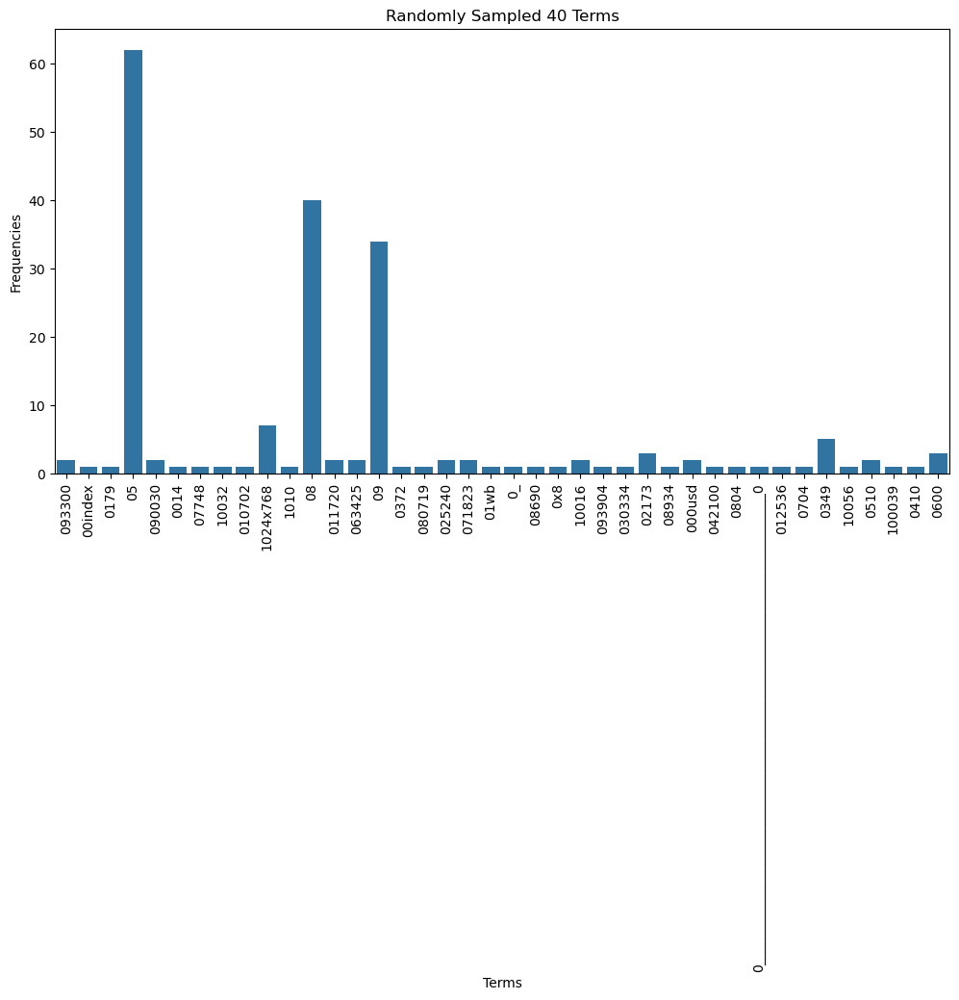

In [54]:
# Get term names and their frequencies
term_names = count_vect.get_feature_names_out()
term_frequencies = term_frequencies.flatten()  # Ensure it's a flat array

# Step 1: Randomly sample 40 indices
num_samples = 40
random_indices = np.random.choice(len(term_frequencies), num_samples, replace=False)

# Step 2: Prepare data for plotting
random_terms = term_names[random_indices]
random_frequencies = term_frequencies[random_indices]

# Step 3: Plot using seaborn
plt.subplots(figsize=(12, 6))  # Adjust size as needed
g = sns.barplot(x=random_terms, y=random_frequencies)
g.set_xticklabels(random_terms, rotation=90)  # Rotate x labels for better visibility
plt.title(f'Randomly Sampled {num_samples} Terms')
plt.xlabel('Terms')
plt.ylabel('Frequencies')
plt.show()

### >>> **Exercise 14 (take home):** 
Additionally, you can attempt to sort the terms on the `x-axis` by frequency instead of in alphabetical order. This way the visualization is more meaninfgul and you will be able to observe the so called [long tail](https://en.wikipedia.org/wiki/Long_tail) (get familiar with this term since it will appear a lot in data mining and other statistics courses). see picture below

![alt txt](https://upload.wikimedia.org/wikipedia/commons/thumb/8/8a/Long_tail.svg/1000px-Long_tail.svg.png)

C:\Users\marcu\AppData\Local\Temp\ipykernel_22900\4248198248.py:21: UserWarning:

set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.



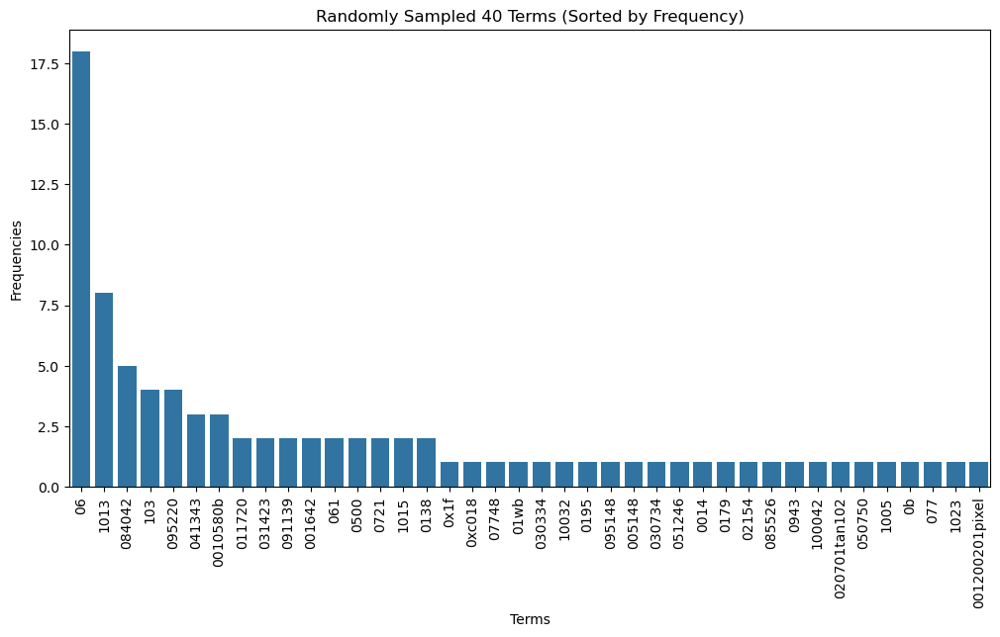

In [56]:
# Get term names and their frequencies
term_names = count_vect.get_feature_names_out()
term_frequencies = term_frequencies.flatten()  # To ensure it's a flat array

# Randomly sample 40 indices
num_samples = 40
random_indices = np.random.choice(len(term_frequencies), num_samples, replace=False)

# Prepare data for plotting
random_terms = term_names[random_indices]
random_frequencies = term_frequencies[random_indices]

# Sort the sampled terms and frequencies from large to small
sorted_indices = np.argsort(random_frequencies)[::-1]  # Get indices of sorted frequencies in descending order
sorted_terms = random_terms[sorted_indices]  # Sort terms according to the sorted indices
sorted_frequencies = random_frequencies[sorted_indices]  # Sort frequencies accordingly

# Plot using seaborn
plt.subplots(figsize=(12, 6)) 
g = sns.barplot(x=sorted_terms, y=sorted_frequencies)
g.set_xticklabels(sorted_terms, rotation=90)  # Rotate x labels for better visibility
plt.title(f'Randomly Sampled {num_samples} Terms (Sorted by Frequency)')
plt.xlabel('Terms')
plt.ylabel('Frequencies')
plt.show()

### >>> **Exercise 15 (take home):** 
You can copy the code from the previous exercise and change the 'term_frequencies' variable for the 'term_frequencies_log', comment about the differences that you observe and talk about other possible insights that we can get from a log distribution.

In [58]:
import math
term_frequencies_log = [math.log(i) for i in term_frequencies]

C:\Users\marcu\AppData\Local\Temp\ipykernel_22900\1837350955.py:19: UserWarning:

set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.



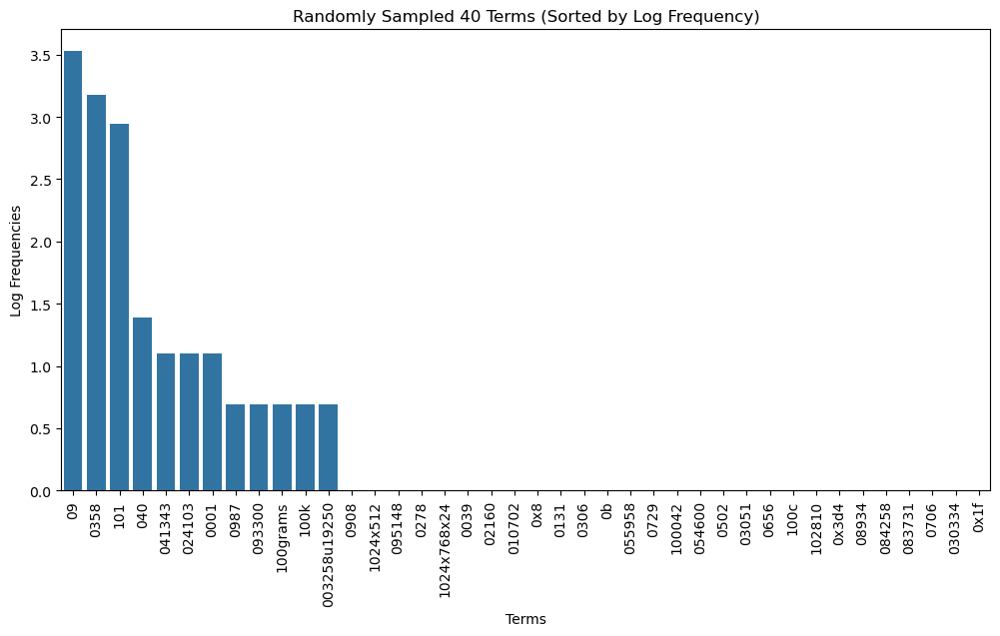

In [59]:
term_names = count_vect.get_feature_names_out()

# Randomly sample 40 indices
num_samples = 40
random_indices = np.random.choice(len(term_frequencies_log), num_samples, replace=False)

# Prepare data for plotting
random_terms = np.array(term_names)[random_indices]  # Convert to a NumPy array for indexing
random_frequencies = np.array(term_frequencies_log)[random_indices]  # Convert to a NumPy array for indexing

# Sort the sampled terms and frequencies from large to small
sorted_indices = np.argsort(random_frequencies)[::-1]  # Get indices of sorted frequencies in descending order
sorted_terms = random_terms[sorted_indices]  # Sort terms according to the sorted indices
sorted_frequencies = random_frequencies[sorted_indices]  # Sort frequencies accordingly

# Plot using seaborn
plt.subplots(figsize=(12, 6))  # Adjust size as needed
g = sns.barplot(x=sorted_terms, y=sorted_frequencies)
g.set_xticklabels(sorted_terms, rotation=90)  # Rotate x labels for better visibility
plt.title(f'Randomly Sampled {num_samples} Terms (Sorted by Log Frequency)')
plt.xlabel('Terms')
plt.ylabel('Log Frequencies')
plt.show()

The primary observation that can be seen is that the scale of the range of values is compressed, which makes it easier to compare between very high and very low frequencies. Terms with low frequencies become more apparent, as it brings it to a more comparable range.

From the example we can see that many datasets are right-skewed, which is especially apparent in the first bar graph, and having this log-transformed barchart actually normalises the data, allowing us to see patterns in the data clearer.

### >>> **Exercise 16 (take home):** 
Review the words that were filtered in each category and comment about the differences and similarities that you can see.

In [62]:
import pandas as pd
from sklearn.feature_extraction.text import CountVectorizer

# Create separate df for each category
categories = X['category_name'].unique()  # Get unique category labels
category_dfs = {}  # dictionary to store dfs for each category

for category in categories:
    # Filter the original DataFrame by category
    category_dfs[category] = X[X['category_name'] == category].copy()

# Function to create term-document frequency df for each category
def create_term_document_df(df):
    count_vect = CountVectorizer() 
    X_counts = count_vect.fit_transform(df['text'])  # Transform the text data into word counts
    
    # Get the unique words from the vectorizer
    words = count_vect.get_feature_names_out()
    
    # Create a df where rows are documents and columns are words
    term_document_df = pd.DataFrame(X_counts.toarray(), columns=words)
    
    return term_document_df

# Create term-document frequency dfs for each category
filt_term_document_dfs = {}  # Dictionary to store term-document DataFrames for each category

for category in categories:
    filt_term_document_dfs[category] = create_term_document_df(category_dfs[category])

In [63]:
category_number=0 #You can change it from 0 to 3

# Filter the bottom 1% and top 5% words based on their sum across all documents
def filter_top_bottom_words_by_sum(term_document_df, top_percent=0.05, bottom_percent=0.01):
    # Calculate the sum of each word across all documents
    word_sums = term_document_df.sum(axis=0)
    
    # Sort the words by their total sum
    sorted_words = word_sums.sort_values()
    
    # Calculate the number of words to remove
    total_words = len(sorted_words)
    top_n = int(top_percent * total_words)
    bottom_n = int(bottom_percent * total_words)
    
    # Get the words to remove from the top 5% and bottom 1%
    words_to_remove = pd.concat([sorted_words.head(bottom_n), sorted_words.tail(top_n)]).index
    print(f'Bottom {bottom_percent*100}% words: \n{sorted_words.head(bottom_n)}') #Here we print which words correspond to the bottom percentage we filter
    print(f'Top {top_percent*100}% words: \n{sorted_words.tail(top_n)}') #Here we print which words correspond to the top percentage we filter
    # Return the DataFrame without the filtered words
    return term_document_df.drop(columns=words_to_remove)

# Apply the filtering function to each category
term_document_dfs = {}

for category in categories:
    print(f'\nFor category {category} we filter the following words:')
    term_document_dfs[category] = filter_top_bottom_words_by_sum(filt_term_document_dfs[category])

# Example: Display the filtered DataFrame for one of the categories
print(f"Filtered Term-Document Frequency DataFrame for Category {categories[category_number]}:")
term_document_dfs[categories[category_number]]



For category comp.graphics we filter the following words:
Bottom 1.0% words: 
initworld    1
jkpg         1
jiu1         1
jiu          1
jfreund      1
            ..
lab2         1
laaksone     1
l4v          1
l300         1
l14h11       1
Length: 137, dtype: int64
Top 5.0% words: 
40               27
distributed      27
open             27
multi            27
getting          27
               ... 
is             1751
and            2382
of             2470
to             2775
the            4537
Length: 687, dtype: int64

For category soc.religion.christian we filter the following words:
Bottom 1.0% words: 
disparate       1
expose          1
explosive       1
resisting       1
exploitation    1
               ..
fence           1
feminist        1
remarriage      1
remarried       1
remeber         1
Length: 138, dtype: int64
Top 5.0% words: 
pagan        36
claims       36
gave         36
parts        36
jr           37
          ...  
that       4393
and        4409
to        

,000,000005102000,000100255pixel,0007,000usd,0010580b,001200201pixel,00196,002,0028,...,zorn,zrz,zsoft,zt,zug,zurich,zvi,zyeh,zyxel,ªl
0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
579,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
580,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
581,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
582,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


As expected, the words with the highest frequencies across all 3 categories tend to be stopwords such as 'the', 'of', 'to' or 'and', all of which being words that are required for constructing coherent sentences in the English language.

When looking at the bottom 1.0% of words, we can see terms that appear very infrequently, especially in more niche categories like comp.graphics or sci.med, which contain more specific field jargon, acronyms and terms that are rarely used in the English language. It is readily apparent that most of the words are immmediately linked to the specific category.

Similarly, the top 5.0% of words are also related to the language of each category, with less niche terms or words that form a high relevant group of words within that domain.

### >>> **Exercise 17 (take home):** 
Implement the FAE Top-K and MaxFPGrowth algorithms from the PAMI library to analyze the 'comp.graphics' category in our processed database. **Only implement the mining part of the algorithm and display the resulting patterns**, like we did with the FPGrowth algorithm after creating the new databases. For the FAE Top-K, run trials with k values of 500, 1000, and 1500, recording the runtime for each. For MaxFPGrowth, test minimum support thresholds of 3, 6, and 9, noting the runtime for these settings as well. Compare the patterns these algorithms extract with those from the previously implemented FPGrowth algorithm. Document your findings, focusing on differences and similarities in the outputs and performance. For this you can find the following google collabs for reference provided by their github repository here: [FAE Top-K](https://colab.research.google.com/github/UdayLab/PAMI/blob/main/notebooks/frequentPattern/topk/FAE.ipynb) and [MaxFPGrowth](https://colab.research.google.com/github/UdayLab/PAMI/blob/main/notebooks/frequentPattern/maximal/MaxFPGrowth.ipynb)

*kindly find all code solutions below

**FAE Top-K:**

As we increased our k-values, we find that runtime increases exponentially; 0.7s to 1.51s to 3.45s for k = 500, 1000, and 1500 respectively. As k increases, the algorithm has to identify and evaluate more patterns, increasing its search space, leading to more iterations and checks in order to find additional patterns. Furthermore, the process of maintaining and sorting a larger list of patterns lengthens the runtime.

However, increasing k did notchange the order of the top few identified patterns with the greatest support (i.e. 'maybe', 'life' or 'ideas'), nor did it change their support values. This is likely due to pattern stability, where certain patterns are inherently more frequent across different k values.

**MaxFPGrowth**

Conversely to FAE Top-K, as we increase the minimum support thresholds for MaxFPGrowth from 3 to 6 to 9, the runtimes decreased from 16.8s to 0.3s to 0.1s. This is due to higher support thresholds filtering out less frequent patterns, decreasing the number of patterns that the algorithm has to evaluate. The algorithm is able to quickly eliminate patterns that do not meet the threshold, thus resulting in less time for both mining and evaluation.

In this case, increasing the minimum support threshold actually led to better results, with it being able to identify patterns of higher support values. This is because these patterns must meet the increased minimum threshold and also because only such patterns are retained. Overall, this results in more significant patterns identified whilst simultaneously decreasing the total number of patterns.

In [362]:
from PAMI.frequentPattern.topk import FAE as FAEtk
inputFile = 'td_freq_db_comp_graphics.csv'

# Input file
inputFile = 'td_freq_db_comp_graphics.csv'
seperator = '\t'

### FAE Top-K

In [364]:
#k value to run
k_values = 500

print(f"\nRunning FAE Top-K with k={k_values}")
    
# Initialize the FAE Top-K algorithm
objfae1 = FAEtk.FAE(iFile=inputFile, k=k_values, sep=seperator)

# Start the mining process
objfae1.mine()
objfae1_pattern= objfae1.getPatternsAsDataFrame()

# Save the results to a separate file for each k
output_filename = f'frequentPatternsMinSupCount{k_values}.txt'
objfae1.save(outFile=output_filename)  # Save to file
    
print(f"Results for k={k_values} saved to {output_filename}")
print('Runtime: ' + str(objfae1.getRuntime()))
objfae1_pattern


Running FAE Top-K with k=500
 TopK frequent patterns were successfully generated using FAE algorithm.
Results for k=500 saved to frequentPatternsMinSupCount500.txt
Runtime: 0.6915302276611328


,Patterns,Support
0,maybe,26
1,life,24
2,ideas,24
3,feel,24
4,tried,24
...,...,...
495,awful posts curious concerning proposed learn ...,12
496,posts curious concerning proposed learn forum ...,12
497,convenience posts curious concerning proposed ...,12
498,posts curious concerning proposed learn forum ...,12


In [366]:
#k value to run
k_values = 1000

print(f"\nRunning FAE Top-K with k={k_values}")
    
# Initialize the FAE Top-K algorithm
objfae2 = FAEtk.FAE(iFile=inputFile, k=k_values, sep=seperator)

# Start the mining process
objfae2.mine()
objfae2_pattern= objfae2.getPatternsAsDataFrame()

# Save the results to a separate file for each k
output_filename = f'frequentPatternsMinSupCount{k_values}.txt'
objfae2.save(outFile=output_filename)  # Save to file
    
print(f"Results for k={k_values} saved to {output_filename}")
print('Runtime: ' + str(objfae2.getRuntime()))
objfae2_pattern


Running FAE Top-K with k=1000
 TopK frequent patterns were successfully generated using FAE algorithm.
Results for k=1000 saved to frequentPatternsMinSupCount1000.txt
Runtime: 1.512749195098877


,Patterns,Support
0,maybe,26
1,life,24
2,ideas,24
3,feel,24
4,tried,24
...,...,...
995,favor proposed forum personally feel wate,12
996,proposed forum personally feel favor,12
997,convenience awful discussing posts curious con...,12
998,awful discussing posts curious concerning prop...,12


In [368]:
#k value to run
k_values = 1500

print(f"\nRunning FAE Top-K with k={k_values}")
    
# Initialize the FAE Top-K algorithm
objfae3 = FAEtk.FAE(iFile=inputFile, k=k_values, sep=seperator)

# Start the mining process
objfae3.mine()
objfae3_pattern= objfae3.getPatternsAsDataFrame()

# Save the results to a separate file for each k
output_filename = f'frequentPatternsMinSupCount{k_values}.txt'
objfae3.save(outFile=output_filename)  # Save to file
    
print(f"Results for k={k_values} saved to {output_filename}")
print('Runtime: ' + str(objfae3.getRuntime()))
objfae3_pattern


Running FAE Top-K with k=1500
 TopK frequent patterns were successfully generated using FAE algorithm.
Results for k=1500 saved to frequentPatternsMinSupCount1500.txt
Runtime: 3.452507734298706


,Patterns,Support
0,maybe,26
1,life,24
2,ideas,24
3,feel,24
4,tried,24
...,...,...
1495,awful discussing favor proposed learn personal...,12
1496,discussing favor proposed learn personally fee...,12
1497,convenience discussing favor proposed learn pe...,12
1498,discussing favor proposed learn personally fee...,12


### MaxFPGrowth

In [73]:
from PAMI.frequentPattern.maximal import MaxFPGrowth  as MaxFP #import the algorithm

minimumSupportCount = 3

objmax1 = MaxFP.MaxFPGrowth(iFile=inputFile, minSup=minimumSupportCount, sep='\t') #initialize
objmax1.mine()            #start the mining process

objmax1.save('maximalFrequentPatternsAtMinSupCount3.txt') #save the patterns

frequentPatternsDF= objmax1.getPatternsAsDataFrame() #get the generated frequent patterns as a dataframe
print('Total No of patterns: ' + str(len(frequentPatternsDF))) #print the total number of patterns
print('Runtime: ' + str(objmax1.getRuntime())) #measure the runtime

print('Memory (RSS): ' + str(objmax1.getMemoryRSS()))
print('Memory (USS): ' + str(objmax1.getMemoryUSS()))

objmax1_pattern= objmax1.getPatternsAsDataFrame()
objmax1_pattern

Maximal Frequent patterns were generated successfully using MaxFp-Growth algorithm 
Total No of patterns: 6872
Runtime: 16.846343755722046
Memory (RSS): 896638976
Memory (USS): 886927360


,Patterns,Support
0,due bytes responsible 000 opinion 640x480 rob ...,3
1,bag,3
2,garbo uwasa,3
3,wrong 200 responsible 000 umn 480 640 tc,3
4,responsible 000 essex,3
...,...,...
6867,didn wondering,3
6868,feel wrong personally,3
6869,wrong correct,3
6870,life correct,3


In [74]:
from PAMI.frequentPattern.maximal import MaxFPGrowth  as MaxFP #import the algorithm

minimumSupportCount = 6

objmax2 = MaxFP.MaxFPGrowth(iFile=inputFile, minSup=minimumSupportCount, sep='\t') #initialize
objmax2.mine()            #start the mining process

objmax2.save('maximalFrequentPatternsAtMinSupCount6.txt') #save the patterns

frequentPatternsDF= objmax2.getPatternsAsDataFrame() #get the generated frequent patterns as a dataframe
print('Total No of patterns: ' + str(len(frequentPatternsDF))) #print the total number of patterns
print('Runtime: ' + str(objmax2.getRuntime())) #measure the runtime

print('Memory (RSS): ' + str(objmax2.getMemoryRSS()))
print('Memory (USS): ' + str(objmax2.getMemoryUSS()))

objmax2_pattern= objmax2.getPatternsAsDataFrame()
objmax2_pattern

Maximal Frequent patterns were generated successfully using MaxFp-Growth algorithm 
Total No of patterns: 1340
Runtime: 0.32706761360168457
Memory (RSS): 896925696
Memory (USS): 887214080


,Patterns,Support
0,tim brock,6
1,face,6
2,pardon,6
3,removal silent assassin cellar tsa,6
4,creative,6
...,...,...
1335,feel apr,8
1336,didn,22
1337,wrong,23
1338,tried,24


In [75]:
from PAMI.frequentPattern.maximal import MaxFPGrowth  as MaxFP #import the algorithm

minimumSupportCount = 9

objmax3 = MaxFP.MaxFPGrowth(iFile=inputFile, minSup=minimumSupportCount, sep='\t') #initialize
objmax3.mine()            #start the mining process

objmax3.save('maximalFrequentPatternsAtMinSupCount9.txt') #save the patterns

frequentPatternsDF= objmax3.getPatternsAsDataFrame() #get the generated frequent patterns as a dataframe
print('Total No of patterns: ' + str(len(frequentPatternsDF))) #print the total number of patterns
print('Runtime: ' + str(objmax3.getRuntime())) #measure the runtime

print('Memory (RSS): ' + str(objmax3.getMemoryRSS()))
print('Memory (USS): ' + str(objmax3.getMemoryUSS()))

objmax3_pattern= objmax3.getPatternsAsDataFrame()
objmax3_pattern

Maximal Frequent patterns were generated successfully using MaxFp-Growth algorithm 
Total No of patterns: 660
Runtime: 0.0969998836517334
Memory (RSS): 897204224
Memory (USS): 887492608


,Patterns,Support
0,tim,9
1,option,9
2,rumours 68070,9
3,chip,9
4,rumours mcmains unt,9
...,...,...
655,wrong,23
656,tried,24
657,ideas,24
658,life,24


### >>> **Exercise 18 (take home):**
Please try to reduce the dimension to 3, and plot the result use 3-D plot. Use at least 3 different angle (camera position) to check your result and describe what you found.

$Hint$: you can refer to Axes3D in the documentation.

*scroll to bottom for visualization

In [77]:
from PAMI.frequentPattern.basic import FPGrowth as alg
minSup=9
obj1 = alg.FPGrowth(iFile='td_freq_db_sci_med.csv', minSup=minSup)
obj1.mine()
frequentPatternsDF_sci_med= obj1.getPatternsAsDataFrame()
print('Total No of patterns: ' + str(len(frequentPatternsDF_sci_med))) # print the total number of patterns
print('Runtime: ' + str(obj1.getRuntime())) # measure the runtime
obj1.save('freq_patterns_sci_med_minSup9.txt') # save the patterns
frequentPatternsDF_sci_med

Frequent patterns were generated successfully using frequentPatternGrowth algorithm
Total No of patterns: 10000
Runtime: 0.13499665260314941


,Patterns,Support
0,leave,9
1,swell,9
2,color,9
3,confused,9
4,learning,9
...,...,...
9995,means,27
9996,haven,27
9997,happen,27
9998,originator,27


In [78]:
from PAMI.frequentPattern.basic import FPGrowth as alg
minSup=9
obj2 = alg.FPGrowth(iFile='td_freq_db_alt_atheism.csv', minSup=minSup)
obj2.mine()
frequentPatternsDF_alt_atheism= obj2.getPatternsAsDataFrame()
print('Total No of patterns: ' + str(len(frequentPatternsDF_alt_atheism))) #print the total number of patterns
print('Runtime: ' + str(obj2.getRuntime())) #measure the runtime
obj2.save('freq_patterns_alt_atheism_minSup9.txt') #save the patterns
frequentPatternsDF_alt_atheism

Frequent patterns were generated successfully using frequentPatternGrowth algorithm
Total No of patterns: 4676
Runtime: 0.2660849094390869


,Patterns,Support
0,choices,9
1,corp,9
2,hausmann,9
3,hausmann maddi,9
4,kids,9
...,...,...
4671,date,31
4672,date gmt,19
4673,stay,32
4674,snm6394,32


In [79]:
from PAMI.frequentPattern.basic import FPGrowth as alg
minSup=9
obj3 = alg.FPGrowth(iFile='td_freq_db_comp_graphics.csv', minSup=minSup)
obj3.mine()
frequentPatternsDF_comp_graphics= obj3.getPatternsAsDataFrame()
print('Total No of patterns: ' + str(len(frequentPatternsDF_comp_graphics))) #print the total number of patterns
print('Runtime: ' + str(obj3.getRuntime())) #measure the runtime
obj3.save('freq_patterns_comp_graphics_minSup9.txt') #save the patterns
frequentPatternsDF_comp_graphics

Frequent patterns were generated successfully using frequentPatternGrowth algorithm
Total No of patterns: 33574
Runtime: 0.09106945991516113


,Patterns,Support
0,individual,9
1,certain,9
2,hall,9
3,mike,9
4,vr,9
...,...,...
33569,life,24
33570,ideas,24
33571,feel,24
33572,tried,24


In [80]:
from PAMI.frequentPattern.basic import FPGrowth as alg
minSup=9
obj4 = alg.FPGrowth(iFile='td_freq_db_soc_religion_christian.csv', minSup=minSup)
obj4.mine()
frequentPatternsDF_soc_religion_christian= obj4.getPatternsAsDataFrame()
print('Total No of patterns: ' + str(len(frequentPatternsDF_soc_religion_christian))) #print the total number of patterns
print('Runtime: ' + str(obj4.getRuntime())) #measure the runtime
obj4.save('freq_patterns_soc_religion_minSup9.txt') #save the patterns
frequentPatternsDF_soc_religion_christian

Frequent patterns were generated successfully using frequentPatternGrowth algorithm
Total No of patterns: 11213
Runtime: 0.3240036964416504


,Patterns,Support
0,latest,9
1,san,9
2,seven,9
3,schools,9
4,chose,9
...,...,...
11208,34,33
11209,institute,33
11210,ways,33
11211,oh,34


In [81]:
import pandas as pd

# group together all of the dataframes related to our found patterns
dfs = [frequentPatternsDF_sci_med, frequentPatternsDF_soc_religion_christian, frequentPatternsDF_comp_graphics, frequentPatternsDF_alt_atheism]


# Identify patterns that appear in more than one category
# Count how many times each pattern appears across all dataframes
pattern_counts = {}
for df in dfs:
    for pattern in df['Patterns']:
        if pattern not in pattern_counts:
            pattern_counts[pattern] = 1
        else:
            pattern_counts[pattern] += 1

# Filter out patterns that appear in more than one df
unique_patterns = {pattern for pattern, count in pattern_counts.items() if count == 1}
# Calculate the total number of patterns across all categories
total_patterns_count = sum(len(df) for df in dfs)
# Calculate how many patterns were discarded
discarded_patterns_count = total_patterns_count - len(unique_patterns)

# For each category, filter the patterns to keep only the unique ones
filtered_dfs = []
for df in dfs:
    filtered_df = df[df['Patterns'].isin(unique_patterns)]
    filtered_dfs.append(filtered_df)

# Merge the filtered dataframes into a final dataframe
final_pattern_df = pd.concat(filtered_dfs, ignore_index=True)

# Sort by support
final_pattern_df = final_pattern_df.sort_values(by='Support', ascending=False)

# Display the final result
print(final_pattern_df)
# Print the number of discarded patterns
print(f"Number of patterns discarded: {discarded_patterns_count}")

                        Patterns  Support
19911                        gov       33
19912                  institute       33
57158                    snm6394       32
19910                       form       31
57156                    deleted       30
...                          ...      ...
54045  axes funds motss matching        9
54044   boy funds motss matching        9
54043    boy axes motss matching        9
54042    et funds motss matching        9
0                          swell        9

[57159 rows x 2 columns]
Number of patterns discarded: 2304


In [82]:
import pandas as pd
from sklearn.feature_extraction.text import CountVectorizer

# Convert 'text' column into term-document matrix using CountVectorizer
count_vect = CountVectorizer()
X_tdm = count_vect.fit_transform(X['text'])  # X['text'] contains your text data
terms = count_vect.get_feature_names_out()  # Original terms in the vocabulary

# Tokenize the sentences into sets of unique words
X['tokenized_text'] = X['text'].str.split().apply(set)

# Initialize the pattern matrix
pattern_matrix = pd.DataFrame(0, index=X.index, columns=final_pattern_df['Patterns'])

# Iterate over each pattern and check if all words in the pattern are present in the tokenized sentence
for pattern in final_pattern_df['Patterns']:
    pattern_words = set(pattern.split())  # Tokenize pattern into words
    pattern_matrix[pattern] = X['tokenized_text'].apply(lambda x: 1 if pattern_words.issubset(x) else 0)

# Convert the term-document matrix to a DataFrame for easy merging
tdm_df = pd.DataFrame(X_tdm.toarray(), columns=terms, index=X.index)

# Concatenate the original TDM and the pattern matrix to augment the features
augmented_df = pd.concat([tdm_df, pattern_matrix], axis=1)

augmented_df

,00,000,0000,0000001200,000005102000,0001,000100255pixel,00014,000406,0007,...,soc princeton funds motss matching,soc princeton boy motss matching,et axes motss matching,soc princeton et motss matching,soc princeton al motss matching,axes funds motss matching,boy funds motss matching,boy axes motss matching,et funds motss matching,swell
0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,1,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2252,0,0,0,0,0,0,0,1,0,0,...,0,0,0,0,0,0,0,0,0,0
2253,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2254,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2255,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


In [83]:
#Applying dimensionality reduction with only the document-term frequency data
from sklearn.decomposition import PCA
from sklearn.manifold import TSNE
import umap
import matplotlib.pyplot as plt

#This might take a couple of minutes to execute
# Apply PCA, t-SNE, and UMAP to the data
X_pca_tdm = PCA(n_components=2).fit_transform(tdm_df.values)
X_tsne_tdm = TSNE(n_components=2).fit_transform(tdm_df.values)
X_umap_tdm = umap.UMAP(n_components=2).fit_transform(tdm_df.values)

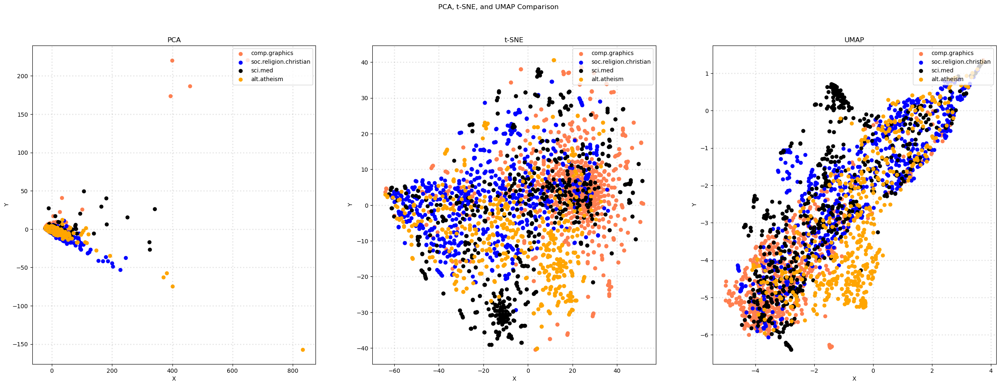

In [84]:
# Plot the results in subplots
col = ['coral', 'blue', 'black', 'orange']
categories = X['category_name'].unique() 

fig, axes = plt.subplots(1, 3, figsize=(30, 10))  # Create 3 subplots for PCA, t-SNE, and UMAP
fig.suptitle('PCA, t-SNE, and UMAP Comparison')

# Define a function to create a scatter plot for each method
def plot_scatter(ax, X_reduced, title):
    for c, category in zip(col, categories):
        xs = X_reduced[X['category_name'] == category].T[0]
        ys = X_reduced[X['category_name'] == category].T[1]
        ax.scatter(xs, ys, c=c, marker='o', label=category)
    
    ax.grid(color='gray', linestyle=':', linewidth=2, alpha=0.2)
    ax.set_title(title)
    ax.set_xlabel('X')
    ax.set_ylabel('Y')
    ax.legend(loc='upper right')

# Step 4: Create scatter plots for PCA, t-SNE, and UMAP
plot_scatter(axes[0], X_pca_tdm, 'PCA')
plot_scatter(axes[1], X_tsne_tdm, 't-SNE')
plot_scatter(axes[2], X_umap_tdm, 'UMAP')

plt.show()

**Exercise 18 Answer**

In [86]:
X_pca_3d = PCA(n_components=3).fit_transform(tdm_df.values)
X_tsne_3d = TSNE(n_components=3).fit_transform(tdm_df.values)
X_umap_3d = umap.UMAP(n_components=3).fit_transform(tdm_df.values)

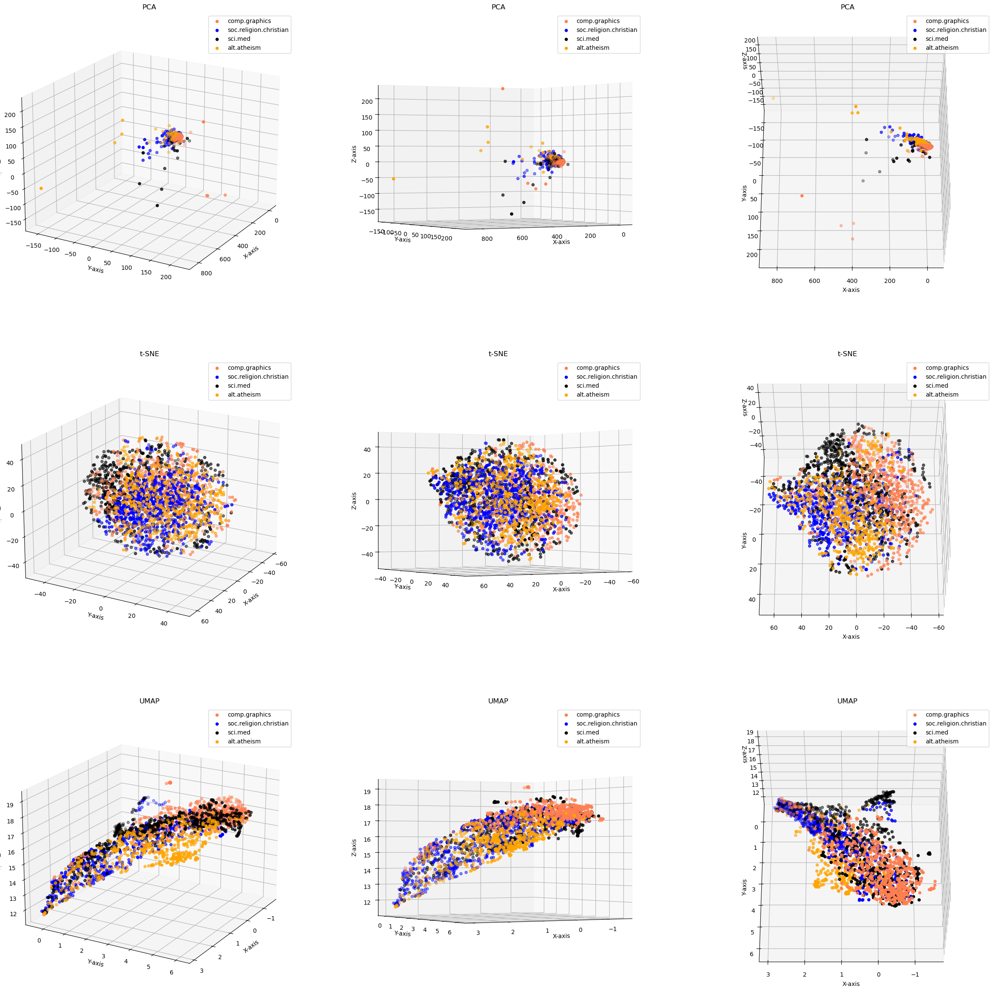

In [87]:
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D  # Required for 3D plotting

col = ['coral', 'blue', 'black', 'orange']
categories = X['category_name'].unique() 

fig = plt.figure(figsize=(30, 30))  # Create a larger figure to hold 9 subplots

# Create 9 subplots, 3 per technique, each with a different view angle
ax1 = fig.add_subplot(331, projection='3d')  # PCA view 1
ax2 = fig.add_subplot(332, projection='3d')  # PCA view 2
ax3 = fig.add_subplot(333, projection='3d')  # PCA view 3
ax4 = fig.add_subplot(334, projection='3d')  # t-SNE view 1
ax5 = fig.add_subplot(335, projection='3d')  # t-SNE view 2
ax6 = fig.add_subplot(336, projection='3d')  # t-SNE view 3
ax7 = fig.add_subplot(337, projection='3d')  # UMAP view 1
ax8 = fig.add_subplot(338, projection='3d')  # UMAP view 2
ax9 = fig.add_subplot(339, projection='3d')  # UMAP view 3

def plot_3d_scatter(ax, X_reduced, title):
    for c, category in zip(col, categories):
        # Filter data for each category
        xs = X_reduced[X['category_name'] == category][:, 0]  # First component
        ys = X_reduced[X['category_name'] == category][:, 1]  # Second component
        zs = X_reduced[X['category_name'] == category][:, 2]  # Third component
        ax.scatter(xs, ys, zs, c=c, marker='o', label=category)

    ax.grid(color='gray', linestyle=':', linewidth=2, alpha=0.2)
    ax.set_title(title)
    ax.set_xlabel('X-axis')
    ax.set_ylabel('Y-axis')
    ax.set_zlabel('Z-axis')
    ax.legend(loc='upper right')

# Plot PCA in the first row with different camera angles
plot_3d_scatter(ax1, X_pca_3d, 'PCA')
ax1.view_init(elev=20, azim=30)
plot_3d_scatter(ax2, X_pca_3d, 'PCA')
ax2.view_init(elev=0, azim=60)
plot_3d_scatter(ax3, X_pca_3d, 'PCA')
ax3.view_init(elev=60, azim=90)

# Plot t-SNE in the second row with different camera angles
plot_3d_scatter(ax4, X_tsne_3d, 't-SNE')
ax4.view_init(elev=20, azim=30)
plot_3d_scatter(ax5, X_tsne_3d, 't-SNE')
ax5.view_init(elev=0, azim=60)
plot_3d_scatter(ax6, X_tsne_3d, 't-SNE')
ax6.view_init(elev=60, azim=90)

# Plot UMAP in the third row with different camera angles
plot_3d_scatter(ax7, X_umap_3d, 'UMAP')
ax7.view_init(elev=20, azim=30)
plot_3d_scatter(ax8, X_umap_3d, 'UMAP')
ax8.view_init(elev=0, azim=60)
plot_3d_scatter(ax9, X_umap_3d, 'UMAP')
ax9.view_init(elev=60, azim=90)

plt.show()


When viewing the scatterplots from different camera angles in 3D, we can more clearly see the separation in data for each visualization. 

From the PCA visualization, we can see a clearer separation in the data, especially for comp.graphics and alt.atheism. Though for the t-SNE graph we observe much of the same scattering and intermixing of categories, we can observe that there are areas that have a much higher concentration of a specific category. Lastly for the UMAP graph, aside from sci.med being more interspersed, the other 3 categories appear to be well differentiated.

### >>> **Exercise 19 (take home):**
Try to generate the binarization using the `category_name` column instead. Does it work?

In [90]:
from sklearn import preprocessing, metrics, decomposition, pipeline, dummy

In [91]:
mlb = preprocessing.LabelBinarizer()

Yes, if we fit the LabelBinarizer() to `category_name`, we ae able to generate the binarization using it. This is because the category_name column contains discrete categorical labels in the form of strings.

In [93]:
mlb.fit(X.category_name)
X['bin_category'] = mlb.transform(X['category_name']).tolist()
X[0:9] 

,text,category,category_name,unigrams,tokenized_text,bin_category
0,From: sd345@city.ac.uk (Michael Collier) Subje...,1,comp.graphics,"[From, :, sd345, @, city.ac.uk, (, Michael, Co...","{hampton, also, email, 477-8565, Subject:, app...","[0, 1, 0, 0]"
1,From: ani@ms.uky.edu (Aniruddha B. Deglurkar) ...,1,comp.graphics,"[From, :, ani, @, ms.uky.edu, (, Aniruddha, B....","{Math, bounded, 2d., Ani., region, If, patch, ...","[0, 1, 0, 0]"
2,From: djohnson@cs.ucsd.edu (Darin Johnson) Sub...,3,soc.religion.christian,"[From, :, djohnson, @, cs.ucsd.edu, (, Darin, ...","{djohnson@cs.ucsd.edu, prayers, What, (Darin, ...","[0, 0, 0, 1]"
3,From: s0612596@let.rug.nl (M.M. Zwart) Subject...,3,soc.religion.christian,"[From, :, s0612596, @, let.rug.nl, (, M.M, ., ...","{From:, birth-control, writing, der, anyone, t...","[0, 0, 0, 1]"
4,From: stanly@grok11.columbiasc.ncr.com (stanly...,3,soc.religion.christian,"[From, :, stanly, @, grok11.columbiasc.ncr.com...","{are, Corp.,, tells, Subject:, kingdom, that, ...","[0, 0, 0, 1]"
5,From: vbv@lor.eeap.cwru.edu (Virgilio (Dean) B...,3,soc.religion.christian,"[From, :, vbv, @, lor.eeap.cwru.edu, (, Virgil...","{are, might, save, wrong,, Virgilio, look, als...","[0, 0, 0, 1]"
6,From: jodfishe@silver.ucs.indiana.edu (joseph ...,3,soc.religion.christian,"[From, :, jodfishe, @, silver.ucs.indiana.edu,...","{are, immoral,, look, forgiven, responsibility...","[0, 0, 0, 1]"
7,From: aldridge@netcom.com (Jacquelin Aldridge)...,2,sci.med,"[From, :, aldridge, @, netcom.com, (, Jacqueli...","{might, save, Subject:, hairline, pimples., in...","[0, 0, 1, 0]"
8,From: geb@cs.pitt.edu (Gordon Banks) Subject: ...,2,sci.med,"[From, :, geb, @, cs.pitt.edu, (, Gordon, Bank...","{are, kinds, respondent, case,, <werner-240393...","[0, 0, 1, 0]"


### **>>> New Dataset begins below**

## 2. Data Preparation

In [96]:
import pandas as pd

Y = pd.read_csv("Nostalgic_Sentiment_Analysis_of_YouTube_Comments_Data.csv") #convert .csv file into pandas df

In [97]:
Y

,sentiment,comment
0,not nostalgia,He was a singer with a golden voice that I lov...
1,nostalgia,The mist beautiful voice ever I listened to hi...
2,nostalgia,I have most of Mr. Reeves songs. Always love ...
3,not nostalgia,30 day leave from 1st tour in Viet Nam to conv...
4,nostalgia,listening to his songs reminds me of my mum wh...
...,...,...
1495,not nostalgia,"i don't know!..but the opening of the video,....."
1496,not nostalgia,it's sad this is such a beautiful song when yo...
1497,not nostalgia,"Dear Friend, I think age and time is not that ..."
1498,nostalgia,I was born in 1954 and started to be aware of ...


In [98]:
len(Y) #quick look at length of data

1500

In [99]:
Y['sentiment'].unique() # view category types for sentiment

array(['not nostalgia', 'nostalgia'], dtype=object)

In [100]:
for t in Y["comment"][:2]:
    print(t) #quick look at first two comments

He was a singer with a golden voice that I love to hear all the time. I was his great fan at the age of 16years in those days and still now. Although we have many singers now, but, I can vouch for Jim Reeves all the time. You feel relaxed, emotional and loving. Thank you Lord for his life.
The mist beautiful voice ever I listened to him when I was a kid and still love his singing Never forgotten The voice of an angel


## 3. Data Transformation


In [102]:
# add new column for sentiment_numeric
Y['sentiment_numeric'] = Y['sentiment'].map({'nostalgia': 1, 'not nostalgia': 0}) 
Y

,sentiment,comment,sentiment_numeric
0,not nostalgia,He was a singer with a golden voice that I lov...,0
1,nostalgia,The mist beautiful voice ever I listened to hi...,1
2,nostalgia,I have most of Mr. Reeves songs. Always love ...,1
3,not nostalgia,30 day leave from 1st tour in Viet Nam to conv...,0
4,nostalgia,listening to his songs reminds me of my mum wh...,1
...,...,...,...
1495,not nostalgia,"i don't know!..but the opening of the video,.....",0
1496,not nostalgia,it's sad this is such a beautiful song when yo...,0
1497,not nostalgia,"Dear Friend, I think age and time is not that ...",0
1498,nostalgia,I was born in 1954 and started to be aware of ...,1


In [103]:
# using loc (by label) to query first 10 comments
Y.loc[:10, 'comment']

0     He was a singer with a golden voice that I lov...
1     The mist beautiful voice ever I listened to hi...
2     I have most of Mr. Reeves songs.  Always love ...
3     30 day leave from 1st tour in Viet Nam to conv...
4     listening to his songs reminds me of my mum wh...
5     Every time I heard this song as a child, I use...
6     My dad loved listening to Jim Reeves, when I w...
7     i HAVE ALSO LISTENED TO Jim Reeves since child...
8              Wherever you  are you always in my heart
9     Elvis will always be number one no one can com...
10    ill bet if they begin to play this song on the...
Name: comment, dtype: object

In [104]:
# using iloc (by position)
X.iloc[:10, 0]

0    From: sd345@city.ac.uk (Michael Collier) Subje...
1    From: ani@ms.uky.edu (Aniruddha B. Deglurkar) ...
2    From: djohnson@cs.ucsd.edu (Darin Johnson) Sub...
3    From: s0612596@let.rug.nl (M.M. Zwart) Subject...
4    From: stanly@grok11.columbiasc.ncr.com (stanly...
5    From: vbv@lor.eeap.cwru.edu (Virgilio (Dean) B...
6    From: jodfishe@silver.ucs.indiana.edu (joseph ...
7    From: aldridge@netcom.com (Jacquelin Aldridge)...
8    From: geb@cs.pitt.edu (Gordon Banks) Subject: ...
9    From: libman@hsc.usc.edu (Marlena Libman) Subj...
Name: text, dtype: object

In [105]:
# using .iat as an alternative to .iloc (0-based indexing) to obtain comment of 10th row
Y.iat[9, 1]

'Elvis will always be number one no one can come close to taking his place the king will always be the king'

In [106]:
# using .at as an alt to loc (label indexing) to obtain category_name of 11th row
Y.at[10, 'comment']

'ill bet if they begin to play this song on the radio to a new generation it could be still a hit ,,that goes for anytime in the future'

## 4. Data Mining using Pandas

### 4.1 Missing Values

In [109]:
# check missing values
Y.isnull()

,sentiment,comment,sentiment_numeric
0,False,False,False
1,False,False,False
2,False,False,False
3,False,False,False
4,False,False,False
...,...,...,...
1495,False,False,False
1496,False,False,False
1497,False,False,False
1498,False,False,False


In [110]:
Y.isnull().apply(lambda x: dmh.check_missing_values(x)) 
# as we can see, there are no missing values found for this dataset as well

,sentiment,comment,sentiment_numeric
0,The amoung of missing records is:,The amoung of missing records is:,The amoung of missing records is:
1,0,0,0


In [111]:
Y.isnull().apply(lambda x: dmh.check_missing_values(x), axis=1)

0       (The amoung of missing records is: , 0)
1       (The amoung of missing records is: , 0)
2       (The amoung of missing records is: , 0)
3       (The amoung of missing records is: , 0)
4       (The amoung of missing records is: , 0)
                         ...                   
1495    (The amoung of missing records is: , 0)
1496    (The amoung of missing records is: , 0)
1497    (The amoung of missing records is: , 0)
1498    (The amoung of missing records is: , 0)
1499    (The amoung of missing records is: , 0)
Length: 1500, dtype: object

In [112]:
# generate series with dummy data to insert
dummy_series = pd.Series(["dummy_record", 'blablabla'], index=["sentiment", "comment"])
dummy_series

sentiment    dummy_record
comment         blablabla
dtype: object

In [113]:
dummy_series.to_frame().T
# .to_frame() -> Convert Series to DataFrame
# .T          -> Transpose

,sentiment,comment
0,dummy_record,blablabla


In [114]:
result_with_series = pd.concat([Y, dummy_series.to_frame().T], ignore_index=True)
len(result_with_series)
# 1501 means that the dummy series has been added successfully

1501

In [115]:
result_with_series.isnull().apply(lambda x: dmh.check_missing_values(x))
# as expected, there is one column with missing value

,sentiment,comment,sentiment_numeric
0,The amoung of missing records is:,The amoung of missing records is:,The amoung of missing records is:
1,0,0,1


In [116]:
# dummy record as dictionary format
dummy_dict = [{'sentiment': 'dummy_record',
               'comment': 1
              }]

In [117]:
Y = pd.concat([Y, pd.DataFrame(dummy_dict)], ignore_index=True)
# concats the dummy entry directly into Y

In [118]:
len(Y)
# original dataframe Y has dummy entry now

1501

In [119]:
Y.isnull().apply(lambda x: dmh.check_missing_values(x))

,sentiment,comment,sentiment_numeric
0,The amoung of missing records is:,The amoung of missing records is:,The amoung of missing records is:
1,0,0,1


In [120]:
Y.dropna(inplace=True) # remove record with missing value

In [121]:
Y.isnull().apply(lambda x: dmh.check_missing_values(x))
len(Y)

1500

Missing value dropped successfully, back to original dataframe with 1500 entries

### 4.2 Dealing with Duplicate Data


In [124]:
Y.duplicated() # check how many duplicate in Y


0       False
1       False
2       False
3       False
4       False
        ...  
1495    False
1496    False
1497    False
1498    False
1499    False
Length: 1500, dtype: bool

In [125]:
sum(Y.duplicated()) # total sum of duplicates

1

In [126]:
Y[Y.duplicated(keep=False)] # code to view duplicated rows

,sentiment,comment,sentiment_numeric
62,not nostalgia,never heard this song before... WOW What an am...,0.0
78,not nostalgia,never heard this song before... WOW What an am...,0.0


In [127]:
Y.drop_duplicates(keep='first', inplace=True)
# since we did not add in any duplicated rows and want to keep one instance, we set keep='first' to store one instance

In [128]:
Y
# one duplicated entry has been removed, resulting in 1500 becoming 1499 entries. 

,sentiment,comment,sentiment_numeric
0,not nostalgia,He was a singer with a golden voice that I lov...,0.0
1,nostalgia,The mist beautiful voice ever I listened to hi...,1.0
2,nostalgia,I have most of Mr. Reeves songs. Always love ...,1.0
3,not nostalgia,30 day leave from 1st tour in Viet Nam to conv...,0.0
4,nostalgia,listening to his songs reminds me of my mum wh...,1.0
...,...,...,...
1495,not nostalgia,"i don't know!..but the opening of the video,.....",0.0
1496,not nostalgia,it's sad this is such a beautiful song when yo...,0.0
1497,not nostalgia,"Dear Friend, I think age and time is not that ...",0.0
1498,nostalgia,I was born in 1954 and started to be aware of ...,1.0


In [129]:
sum(Y.duplicated()) # check that all rows are now unique

0

## 5.  Data Preprocessing


### 5.1 Sampling


In [132]:
Y_sample = Y.sample(n=1000) #random state, samples 1000 entries 

In [133]:
len(Y_sample)

1000

In [134]:
Y_sample[0:4]

,sentiment,comment,sentiment_numeric
1019,not nostalgia,By far my favorite singer of all time. So pure...,0.0
432,nostalgia,Just closing your eyes while the songs of yest...,1.0
456,nostalgia,thanks takes me back to my younger days a clas...,1.0
350,nostalgia,The last waltz always remind me about 40yrs ag...,1.0


In [135]:
Y

,sentiment,comment,sentiment_numeric
0,not nostalgia,He was a singer with a golden voice that I lov...,0.0
1,nostalgia,The mist beautiful voice ever I listened to hi...,1.0
2,nostalgia,I have most of Mr. Reeves songs. Always love ...,1.0
3,not nostalgia,30 day leave from 1st tour in Viet Nam to conv...,0.0
4,nostalgia,listening to his songs reminds me of my mum wh...,1.0
...,...,...,...
1495,not nostalgia,"i don't know!..but the opening of the video,.....",0.0
1496,not nostalgia,it's sad this is such a beautiful song when yo...,0.0
1497,not nostalgia,"Dear Friend, I think age and time is not that ...",0.0
1498,nostalgia,I was born in 1954 and started to be aware of ...,1.0


In [136]:
Y_sample

,sentiment,comment,sentiment_numeric
1019,not nostalgia,By far my favorite singer of all time. So pure...,0.0
432,nostalgia,Just closing your eyes while the songs of yest...,1.0
456,nostalgia,thanks takes me back to my younger days a clas...,1.0
350,nostalgia,The last waltz always remind me about 40yrs ag...,1.0
374,nostalgia,Beautiful song and great memories of the late ...,1.0
...,...,...,...
1278,nostalgia,I was 12 when this song was released. I recor...,1.0
1003,nostalgia,These days I really wish It could be yesterday...,1.0
738,not nostalgia,Goodnight thankfully it songs. I listened ...,0.0
841,nostalgia,Oh remember when I was like 4 years old and my...,1.0


Similar to the previous dataset, we can observe that the index numbering for Y_sample does not start from 0 unlike Y, and the index numbering does not count up starting from 0 sequentially, nor does it follow any ordering from largest to smallest or vice versa.

In [138]:
import matplotlib.pyplot as plt
%matplotlib inline

In [139]:
sentiment = ['not nostalgia', 'nostalgia']
sentiment

['not nostalgia', 'nostalgia']

sentiment
nostalgia        750
not nostalgia    749
Name: count, dtype: int64


<Axes: title={'center': 'Category distribution'}, xlabel='sentiment'>

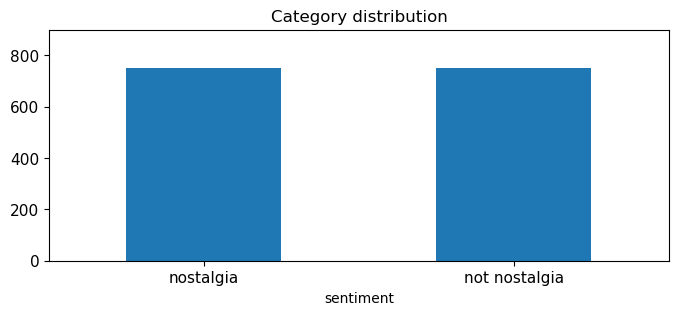

In [140]:
print(Y.sentiment.value_counts())

# plot barchart for Y
Y.sentiment.value_counts().plot(kind = 'bar',
                                    title = 'Category distribution',
                                    ylim = [0, 900],        
                                    rot = 0, fontsize = 11, figsize = (8,3))

sentiment
nostalgia        506
not nostalgia    494
Name: count, dtype: int64


<Axes: title={'center': 'Category distribution'}, xlabel='sentiment'>

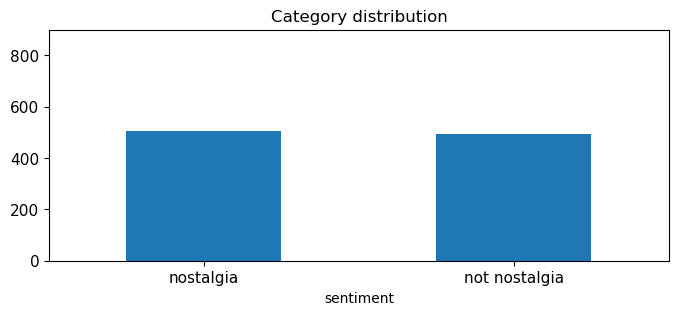

In [141]:
print(Y_sample.sentiment.value_counts())

# plot barchart for Y_sample
Y_sample.sentiment.value_counts().plot(kind = 'bar',
                                    title = 'Category distribution',
                                    ylim = [0, 900],        
                                    rot = 0, fontsize = 11, figsize = (8,3))

Thus from above we can visualize that both X_sample and X have an almost 50/50 ratio split between the two sentiment categories.

<Axes: title={'center': 'Category distribution'}, xlabel='sentiment'>

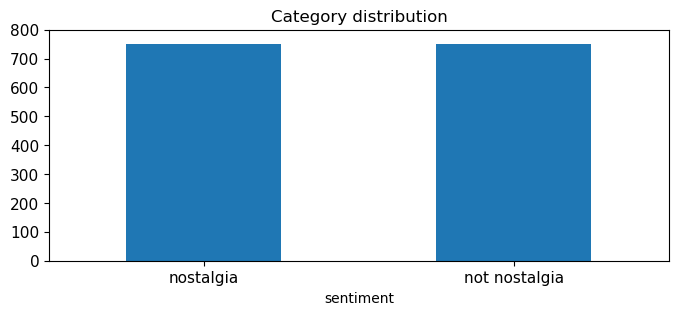

In [143]:
Y_category_count = Y.sentiment.value_counts()
Y_category_count

# plot barchart for Y
Y.sentiment.value_counts().plot(kind = 'bar',
                                    title = 'Category distribution',
                                    ylim = [0, Y_category_count.max() + 50],  ## .max() obtains maximum count out of all categories, then adds a constant +50 y-axis buffer to ensure better presentation  
                                    rot = 0, fontsize = 11, figsize = (8,3))

As before, we can automate the y-axis as well to always provide a +50 buffer regardless of the max() count of rows in the dataset.

<Axes: title={'center': 'Category Distribution: Y vs. Y_sample'}, xlabel='sentiment'>

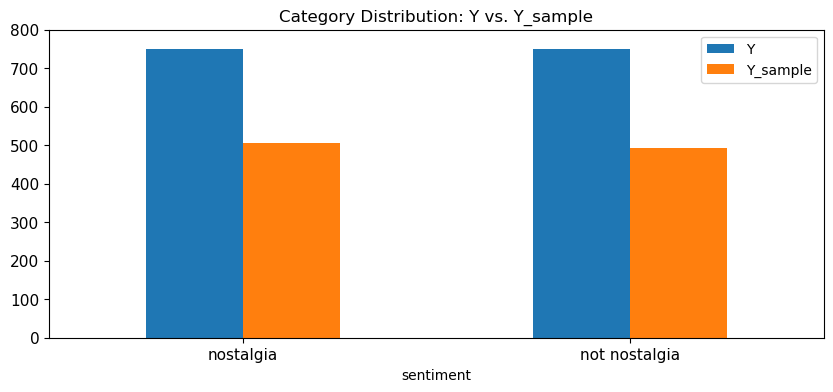

In [145]:
Y_category_count = Y.sentiment.value_counts()
category_count_Y_sample = Y_sample.sentiment.value_counts()

comparison_Y_df = pd.DataFrame({   # Combines both counts into single df
    'Y': Y_category_count,
    'Y_sample': category_count_Y_sample})

# plot barchart for Y
comparison_Y_df.plot(kind='bar',
                   title='Category Distribution: Y vs. Y_sample',
                   ylim=[0, max(Y_category_count.max(), category_count_Y_sample.max()) + 50],  # Dynamically set y-axis based on max of both
                   rot=0, fontsize=11, figsize=(10, 4))

We are able to view barplots for both Y and Y_sample side by side as well.

### 5.2 Feature Creation


In [148]:
import nltk
nltk.download('punkt_tab')

[nltk_data] Downloading package punkt_tab to
[nltk_data]     C:\Users\marcu\AppData\Roaming\nltk_data...
[nltk_data]   Package punkt_tab is already up-to-date!


True

In [149]:
# takes a like a minute or two to process
Y['unigrams'] = Y['comment'].apply(lambda x: dmh.tokenize_text(x))

In [150]:
Y[0:4]["unigrams"]

0    [He, was, a, singer, with, a, golden, voice, t...
1    [The, mist, beautiful, voice, ever, I, listene...
2    [I, have, most, of, Mr., Reeves, songs, ., Alw...
3    [30, day, leave, from, 1st, tour, in, Viet, Na...
Name: unigrams, dtype: object

In [151]:
Y[0:5]

,sentiment,comment,sentiment_numeric,unigrams
0,not nostalgia,He was a singer with a golden voice that I lov...,0.0,"[He, was, a, singer, with, a, golden, voice, t..."
1,nostalgia,The mist beautiful voice ever I listened to hi...,1.0,"[The, mist, beautiful, voice, ever, I, listene..."
2,nostalgia,I have most of Mr. Reeves songs. Always love ...,1.0,"[I, have, most, of, Mr., Reeves, songs, ., Alw..."
3,not nostalgia,30 day leave from 1st tour in Viet Nam to conv...,0.0,"[30, day, leave, from, 1st, tour, in, Viet, Na..."
4,nostalgia,listening to his songs reminds me of my mum wh...,1.0,"[listening, to, his, songs, reminds, me, of, m..."


In [152]:
list(Y[4:5]['unigrams'])

[['listening',
  'to',
  'his',
  'songs',
  'reminds',
  'me',
  'of',
  'my',
  'mum',
  'who',
  'played',
  'him',
  'everyday']]

### 5.3 Feature subset selection


In [154]:
from sklearn.feature_extraction.text import CountVectorizer

count_vect = CountVectorizer()
Y_counts = count_vect.fit_transform(Y.comment) #learn the vocabulary and return document-term matrix
print(Y_counts[0])

  (0, 1598)	1
  (0, 3570)	2
  (0, 2973)	1
  (0, 3650)	1
  (0, 1470)	1
  (0, 3534)	1
  (0, 3282)	1
  (0, 2028)	1
  (0, 3336)	1
  (0, 1606)	1
  (0, 233)	2
  (0, 3284)	3
  (0, 3328)	2
  (0, 1651)	2
  (0, 1512)	1
  (0, 1249)	1
  (0, 323)	1
  (0, 214)	1
  (0, 2341)	1
  (0, 15)	1
  (0, 1733)	1
  (0, 3304)	1
  (0, 907)	1
  (0, 258)	2
  (0, 3124)	1
  (0, 2328)	2
  (0, 245)	1
  (0, 3581)	1
  (0, 1591)	1
  (0, 2082)	1
  (0, 2974)	1
  (0, 573)	1
  (0, 593)	1
  (0, 3538)	1
  (0, 1347)	2
  (0, 1833)	1
  (0, 2671)	1
  (0, 3713)	2
  (0, 1272)	1
  (0, 2688)	1
  (0, 1125)	1
  (0, 2035)	1
  (0, 3278)	1
  (0, 2018)	1
  (0, 1964)	1


In [155]:
count_vect.get_feature_names_out()[3581] #view feature based on index in vector

'we'

In [156]:
count_vect.get_feature_names_out()[1125]

'emotional'

In [157]:
analyze(Y['comment'][0]) # using analyzer to analyze first record of Y dataframe

['he',
 'was',
 'singer',
 'with',
 'golden',
 'voice',
 'that',
 'love',
 'to',
 'hear',
 'all',
 'the',
 'time',
 'was',
 'his',
 'great',
 'fan',
 'at',
 'the',
 'age',
 'of',
 '16years',
 'in',
 'those',
 'days',
 'and',
 'still',
 'now',
 'although',
 'we',
 'have',
 'many',
 'singers',
 'now',
 'but',
 'can',
 'vouch',
 'for',
 'jim',
 'reeves',
 'all',
 'the',
 'time',
 'you',
 'feel',
 'relaxed',
 'emotional',
 'and',
 'loving',
 'thank',
 'you',
 'lord',
 'for',
 'his',
 'life']

In [158]:
# We can check the shape of this matrix by:
Y_counts.shape

(1499, 3730)

In [159]:
# We can obtain the feature names of the vectorizer, i.e., the terms
# usually on the horizontal axis
count_vect.get_feature_names_out()[0:10]

array(['00', '000', '045', '07', '10', '100', '10m', '11', '11th', '12'],
      dtype=object)

In [160]:
# we convert from sparse array to normal array
Y_counts[0:5, 0:100].toarray()

array([[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0,
        0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
        0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
        0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
        0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0],
       [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
        0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
        0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
        0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
        0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0],
       [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0,
        0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
        0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
        0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
        0, 0, 0, 0, 0,

In [161]:
feature_names = count_vect.get_feature_names_out()

# Assuming `array` is the name of your array, let's find the words corresponding to each '1'
for row_idx, row in enumerate(Y_counts[0:5, 0:100].toarray()):
    # Find indices where '1' appears
    word_indices = np.where(row == 1)[0]
    words = [feature_names[i] for i in word_indices]
    print(f"Row {row_idx} words:", words)

Row 0 words: ['16years']
Row 1 words: []
Row 2 words: ['17']
Row 3 words: ['1st', '2nd', '30']
Row 4 words: []


The above for-loop allows us to obtain the words that appear in each of the first 5 records.

In [163]:
# first twenty features only
plot_x = ["term_"+str(i) for i in count_vect.get_feature_names_out()[0:20]]

In [164]:
# obtain document index
plot_y = ["doc_"+ str(i) for i in list(Y.index)[0:20]]

In [165]:
plot_z = Y_counts[0:20, 0:20].toarray() #Y_counts[how many documents, how many terms]
plot_z

array([[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0],
       [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0],
       [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0],
       [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0],
       [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0],
       [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0],
       [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0],
       [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0],
       [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0],
       [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0],
       [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0],
       [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0],
       [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0],
       [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0],
       [0, 0, 0, 0, 0, 0, 0, 0, 0,

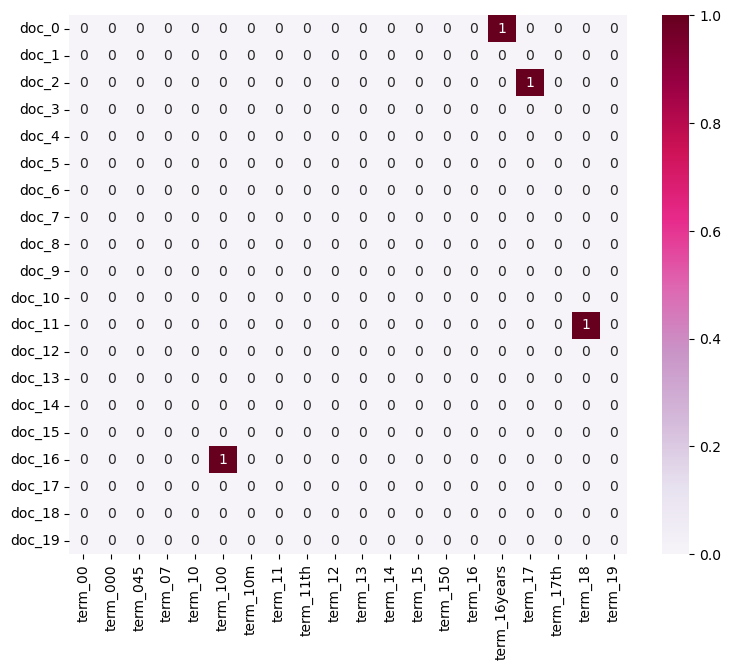

In [166]:
import seaborn as sns

df_todraw = pd.DataFrame(plot_z, columns = plot_x, index = plot_y)
plt.subplots(figsize=(9, 7))
ax = sns.heatmap(df_todraw,
                 cmap="PuRd",
                 vmin=0, vmax=1, annot=True)

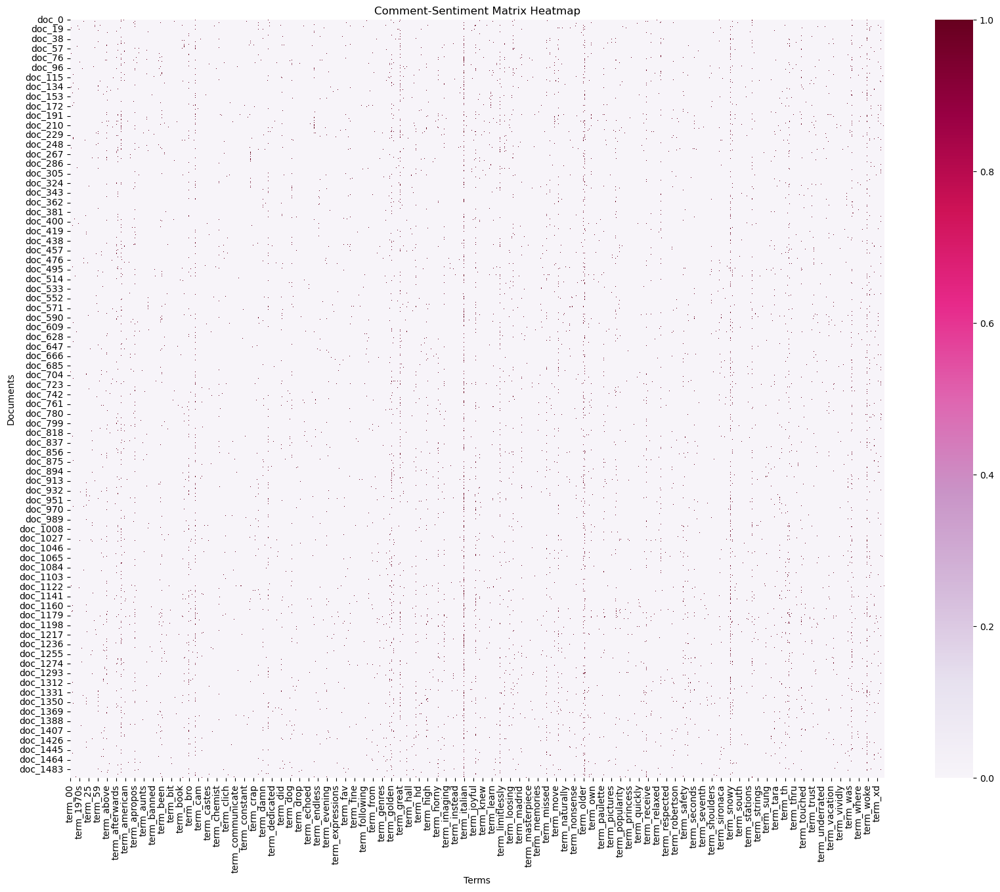

In [167]:
plot_x = ["term_" + str(i) for i in count_vect.get_feature_names_out()]  # All terms
plot_y = ["doc_" + str(i) for i in list(Y.index)]  # All documents
plot_z = Y_counts.toarray()  # Entire term-document matrix

import seaborn as sns
import matplotlib.pyplot as plt

# Create a DataFrame for the heatmap
df_todraw = pd.DataFrame(plot_z, columns=plot_x, index=plot_y)

# Set up the plot size based on the dimensions of the matrix
plt.subplots(figsize=(20, 15))  # Adjust the figure size as needed
ax = sns.heatmap(df_todraw,
                 cmap="PuRd",
                 vmin=0, vmax=1,  # Adjust vmin and vmax based on your data
                 annot=False)  #  annot=True can be set to show the counts in the cells
plt.title('Comment-Sentiment Matrix Heatmap')
plt.xlabel('Terms')
plt.ylabel('Documents')
plt.show()


The above is the term-document heatmap for all terms and all documents in the dataset, but is not particularly meaningful.

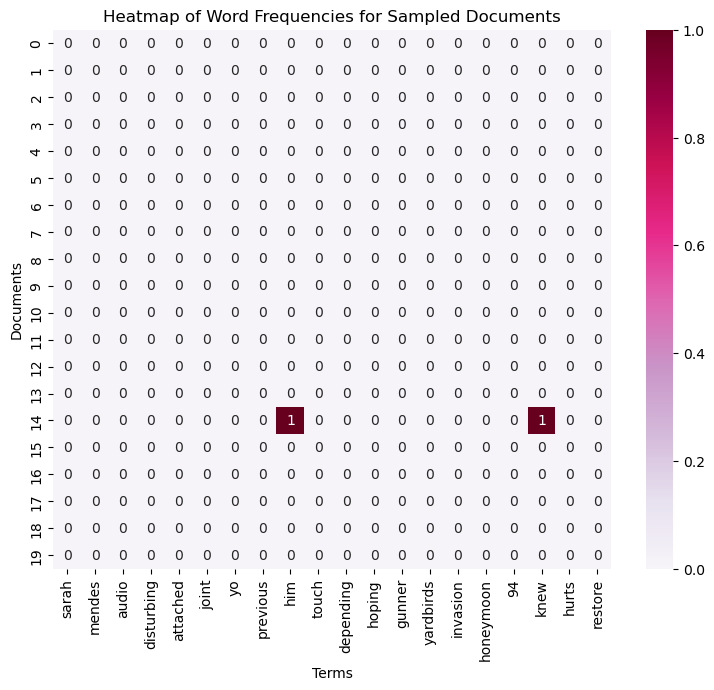

In [169]:
# Randomly select 20 documents (rows) and 20 terms (columns)
num_rows = 20
num_cols = 20
random_rows = np.random.choice(Y_counts.shape[0], num_rows, replace=False)
random_cols = np.random.choice(Y_counts.shape[1], num_cols, replace=False)

# Convert the selected rows and columns to a dense array
selected_data = Y_counts[random_rows, :][:, random_cols].toarray()

# Get the corresponding feature names (terms)
selected_terms = count_vect.get_feature_names_out()[random_cols]

# Create a DataFrame for visualization
df_todraw = pd.DataFrame(selected_data, columns=selected_terms)

# Plot the heatmap
plt.subplots(figsize=(9, 7))
ax = sns.heatmap(df_todraw, cmap="PuRd", annot=True)
plt.title('Heatmap of Word Frequencies for Sampled Documents')
plt.xlabel('Terms')
plt.ylabel('Documents')
plt.show()

Similarly, this is the heatmap for 20 randomly sampled documents and terms from our dataset.

### 5.4 Attribute Transformation / Aggregation


In [172]:
# note this takes time to compute. You may want to reduce the amount of terms you want to compute frequencies for
term_frequencies = []
for j in range(0,Y_counts.shape[1]):
    term_frequencies.append(sum(Y_counts[:,j].toarray()))

In [173]:
term_frequencies = np.asarray(Y_counts.sum(axis=0))[0]

In [174]:
term_frequencies[0] #sum of first term: 00

1

C:\Users\marcu\AppData\Local\Temp\ipykernel_22900\3480579971.py:4: UserWarning:

set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.



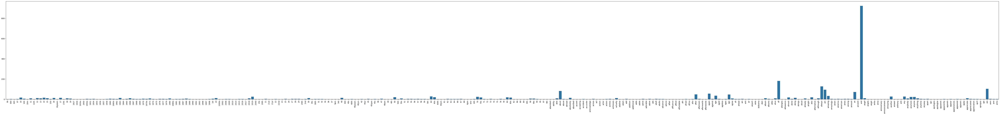

In [175]:
plt.subplots(figsize=(100, 10))
g = sns.barplot(x=count_vect.get_feature_names_out()[:300], 
            y=term_frequencies[:300])
g.set_xticklabels(count_vect.get_feature_names_out()[:300], rotation = 90);

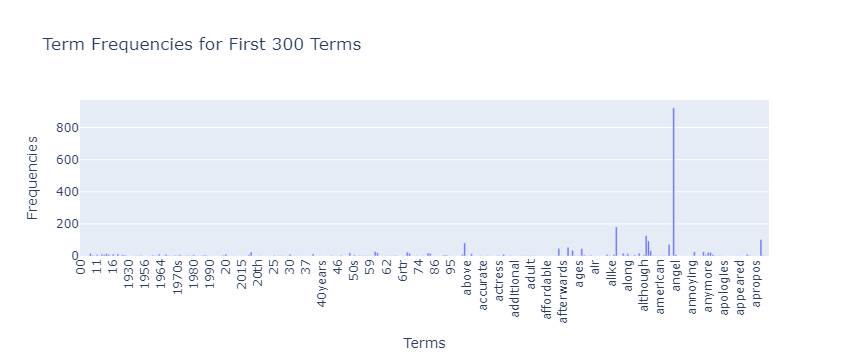

In [176]:
import plotly.express as px

term_frequencies = term_frequencies[:300]  # Get the first 300 term frequencies
term_names = count_vect.get_feature_names_out()[:300]  # Get the first 300 term names

# Create a df for Plotly
df_terms = pd.DataFrame({
    'Term': term_names,
    'Frequency': term_frequencies
})

# Create the bar plot using Plotly
fig = px.bar(df_terms, x='Term', y='Frequency', title='Term Frequencies for First 300 Terms',
             labels={'Term': 'Terms', 'Frequency': 'Frequencies'})

# Update layout for better visibility
fig.update_layout(xaxis_title='Terms', yaxis_title='Frequencies', xaxis_tickangle=-90)

# Show the figure
fig.show()

The above is the same bargraph but using plotly so it is interactive.

C:\Users\marcu\AppData\Local\Temp\ipykernel_22900\4140305709.py:16: UserWarning:

set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.



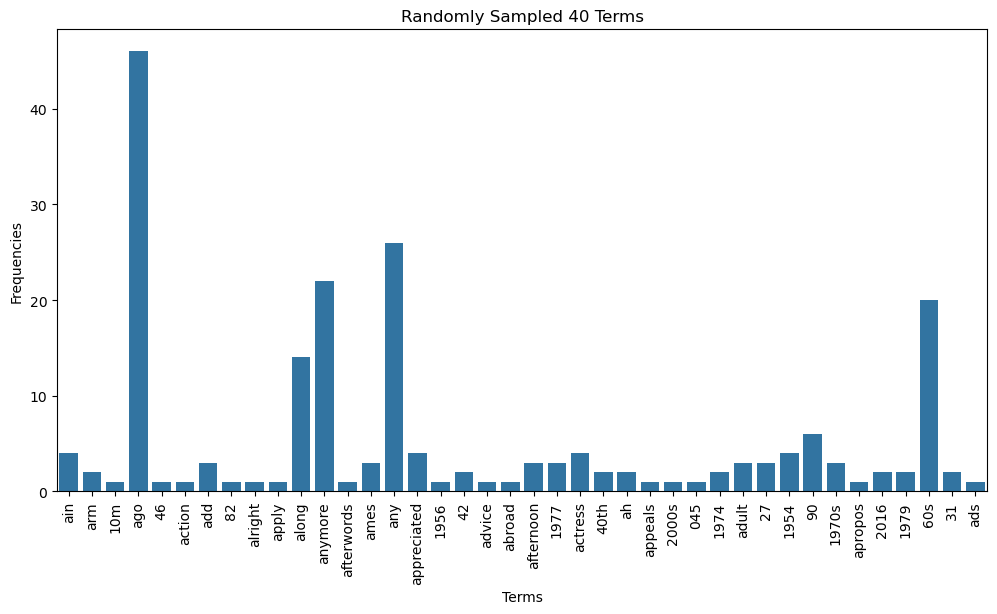

In [178]:
# Get term names and their frequencies
term_names = count_vect.get_feature_names_out()
term_frequencies = term_frequencies.flatten()  # Ensure it's a flat array

# Step 1: Randomly sample 40 indices
num_samples = 40
random_indices = np.random.choice(len(term_frequencies), num_samples, replace=False)

# Step 2: Prepare data for plotting
random_terms = term_names[random_indices]
random_frequencies = term_frequencies[random_indices]

# Step 3: Plot using seaborn
plt.subplots(figsize=(12, 6))  # Adjust size as needed
g = sns.barplot(x=random_terms, y=random_frequencies)
g.set_xticklabels(random_terms, rotation=90)  # Rotate x labels for better visibility
plt.title(f'Randomly Sampled {num_samples} Terms')
plt.xlabel('Terms')
plt.ylabel('Frequencies')
plt.show()

The above is a randomly sampled group of 40 terms and their frequencies.

C:\Users\marcu\AppData\Local\Temp\ipykernel_22900\2560298929.py:21: UserWarning:

set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.



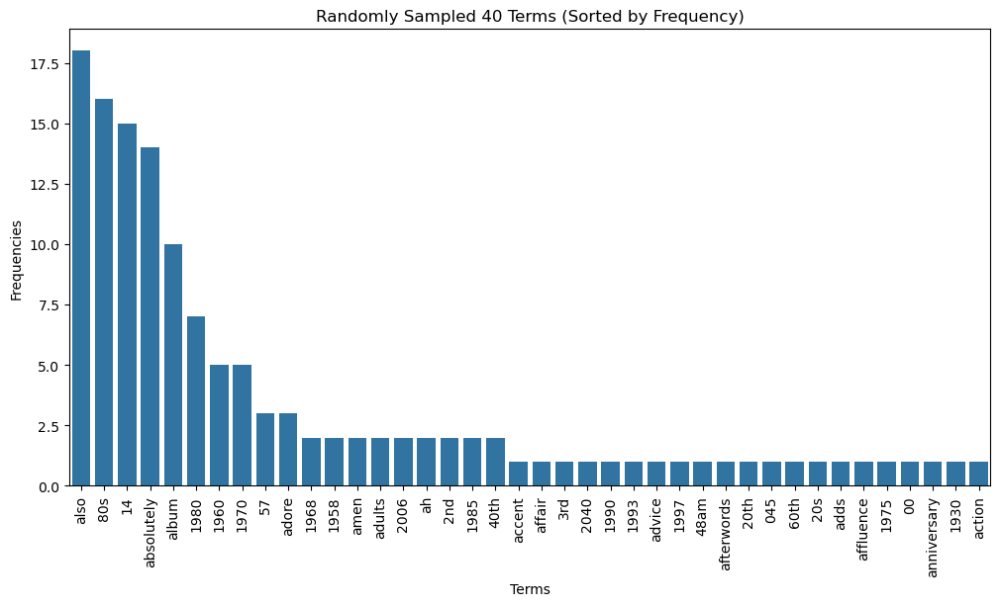

In [180]:
# Get term names and their frequencies
term_names = count_vect.get_feature_names_out()
term_frequencies = term_frequencies.flatten()  # Ensure it's a flat array

# Step 1: Randomly sample 40 indices
num_samples = 40
random_indices = np.random.choice(len(term_frequencies), num_samples, replace=False)

# Step 2: Prepare data for plotting
random_terms = term_names[random_indices]
random_frequencies = term_frequencies[random_indices]

# Step 3: Sort the sampled terms and frequencies from large to small
sorted_indices = np.argsort(random_frequencies)[::-1]  # Get indices of sorted frequencies in descending order
sorted_terms = random_terms[sorted_indices]  # Sort terms according to the sorted indices
sorted_frequencies = random_frequencies[sorted_indices]  # Sort frequencies accordingly

# Step 4: Plot using seaborn
plt.subplots(figsize=(12, 6))  # Adjust size as needed
g = sns.barplot(x=sorted_terms, y=sorted_frequencies)
g.set_xticklabels(sorted_terms, rotation=90)  # Rotate x labels for better visibility
plt.title(f'Randomly Sampled {num_samples} Terms (Sorted by Frequency)')
plt.xlabel('Terms')
plt.ylabel('Frequencies')
plt.show()




Similarly, a group of 40 randomly sampled terms arranged by frequency to form a long tail.

In [182]:
import math
term_frequencies_log = [math.log(i) for i in term_frequencies]

C:\Users\marcu\AppData\Local\Temp\ipykernel_22900\2166548998.py:4: UserWarning:

set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.



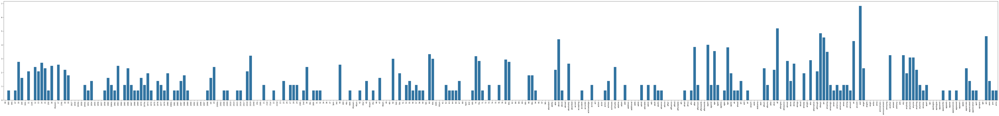

In [183]:
plt.subplots(figsize=(100, 10))
g = sns.barplot(x=count_vect.get_feature_names_out()[:300],
                y=term_frequencies_log[:300])
g.set_xticklabels(count_vect.get_feature_names_out()[:300], rotation = 90);

The above is a bargraph after log-transforming our data.

C:\Users\marcu\AppData\Local\Temp\ipykernel_22900\1182151851.py:19: UserWarning:

set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.



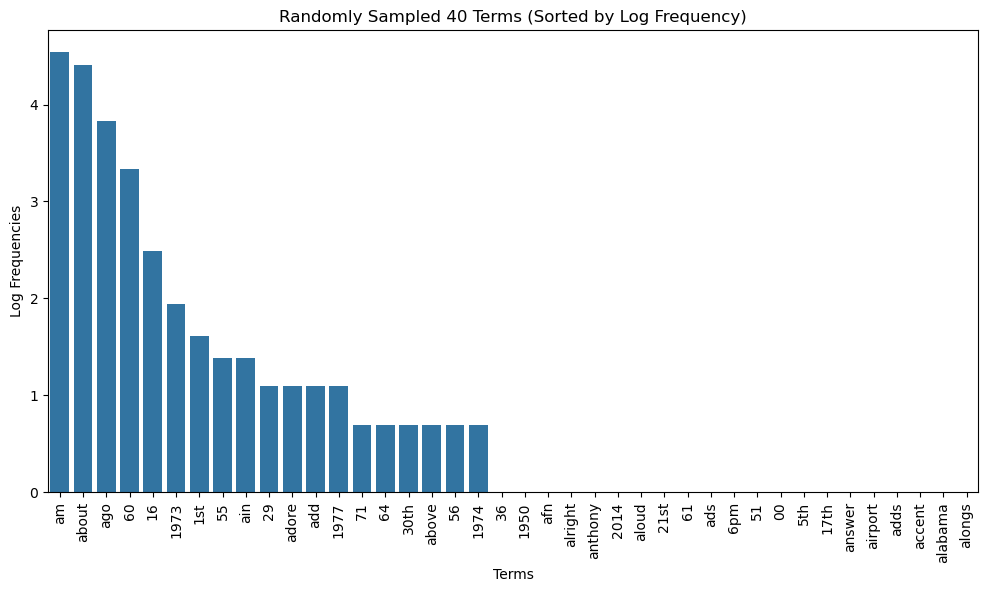

In [185]:
term_names = count_vect.get_feature_names_out()

# Step 1: Randomly sample 40 indices
num_samples = 40
random_indices = np.random.choice(len(term_frequencies_log), num_samples, replace=False)

# Step 2: Prepare data for plotting
random_terms = np.array(term_names)[random_indices]  # Convert to a NumPy array for indexing
random_frequencies = np.array(term_frequencies_log)[random_indices]  # Convert to a NumPy array for indexing

# Step 3: Sort the sampled terms and frequencies from large to small
sorted_indices = np.argsort(random_frequencies)[::-1]  # Get indices of sorted frequencies in descending order
sorted_terms = random_terms[sorted_indices]  # Sort terms according to the sorted indices
sorted_frequencies = random_frequencies[sorted_indices]  # Sort frequencies accordingly

# Step 4: Plot using seaborn
plt.subplots(figsize=(12, 6))  # Adjust size as needed
g = sns.barplot(x=sorted_terms, y=sorted_frequencies)
g.set_xticklabels(sorted_terms, rotation=90)  # Rotate x labels for better visibility
plt.title(f'Randomly Sampled {num_samples} Terms (Sorted by Log Frequency)')
plt.xlabel('Terms')
plt.ylabel('Log Frequencies')
plt.show()

Simimarly, we can see that the y-axis has been compressed and the bargraphs are brought closer for easier comparison of frequencies.

In [187]:
import pandas as pd
from sklearn.feature_extraction.text import CountVectorizer

#Create separate DataFrames for each category
categories = Y['sentiment'].unique()  # Get unique category labels
category_dfs = {}  # Dictionary to store DataFrames for each category

for category in categories:
    # Filter the original DataFrame by category
    category_dfs[category] = Y[Y['sentiment'] == category].copy()

# Function to create term-document frequency DataFrame for each category
def create_term_document_df(df):
    count_vect = CountVectorizer()  # Initialize the CountVectorizer
    Y_counts = count_vect.fit_transform(df['comment'])  # Transform the text data into word counts
    
    # Get the unique words (vocabulary) from the vectorizer
    words = count_vect.get_feature_names_out()
    
    # Create a DataFrame where rows are documents and columns are words
    term_document_df = pd.DataFrame(Y_counts.toarray(), columns=words)
    
    return term_document_df

# Create term-document frequency DataFrames for each category
filt_term_document_dfs = {}  # Dictionary to store term-document DataFrames for each category

for category in categories:
    filt_term_document_dfs[category] = create_term_document_df(category_dfs[category])

In [188]:
# Display the filtered DataFrame for one of the categories, feel free to change the number in the vector
category_number=0 #You can change it from 0 or 1
print(f"Filtered Term-Document Frequency DataFrame for Category {categories[category_number]}:")
filt_term_document_dfs[categories[category_number]]

Filtered Term-Document Frequency DataFrame for Category not nostalgia:


,00,000,045,10,100,10m,11,12,14,15,...,youngest,youngsters,your,yourself,youth,youtube,yrs,yuo,zealand,zulus
0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
744,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
745,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
746,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
747,0,0,0,0,0,0,0,0,0,0,...,0,0,1,0,0,0,0,0,0,0


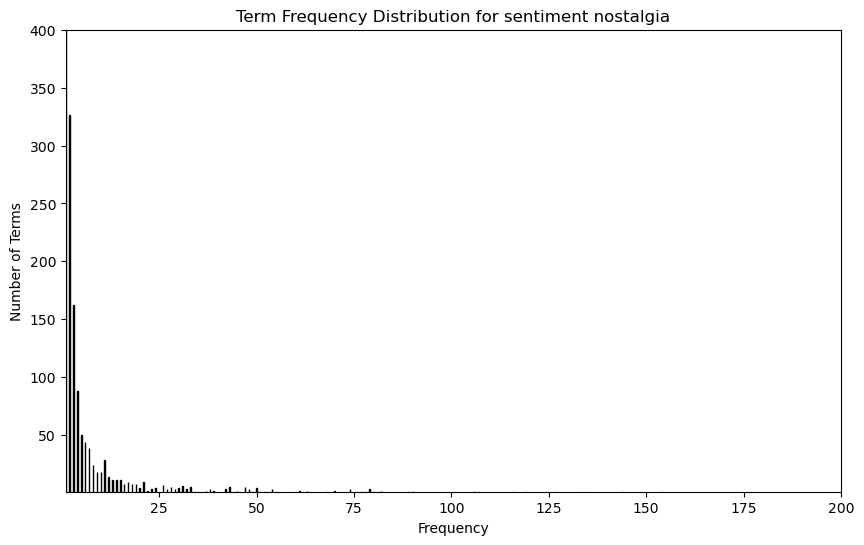

In [189]:
 # Sum over all documents to get total frequency for each word
category_number=1 #You can change it from 0 or 1
word_counts = filt_term_document_dfs[categories[category_number]].sum(axis=0).to_numpy()
 
# Visualize the frequency distribution
plt.figure(figsize=(10, 6))
plt.hist(word_counts, bins=5000, color='blue', edgecolor='black')
plt.title(f'Term Frequency Distribution for sentiment {categories[category_number]}')
plt.xlabel('Frequency')
plt.ylabel('Number of Terms')
plt.xlim(1, 200)
plt.ylim(1, 400)
plt.show()

In [190]:
category_number=1 #You can change it from 0 or 1
word_counts = filt_term_document_dfs[categories[category_number]].sum(axis=0).to_numpy()

# Sort the term frequencies in descending order
sorted_indices = np.argsort(word_counts)[::-1]  # Get indices of sorted frequencies
sorted_counts = np.sort(word_counts)[::-1]  # Sort frequencies in descending order

# Calculate the index corresponding to the top 5% most frequent terms
total_terms = len(sorted_counts)
top_5_percent_index = int(0.05 * total_terms)

# Get the indices of the top 5% most frequent terms
top_5_percent_indices = sorted_indices[:top_5_percent_index]

# Filter terms that belong to the top 5% based on their rank
filtered_words = [filt_term_document_dfs[categories[category_number]].iloc[:, i].name for i in top_5_percent_indices]

print(f"Category: {categories[category_number]}")
print(f"Number of terms in top 5%: {top_5_percent_index}")
print(f"Filtered terms: {filtered_words}")


Category: nostalgia
Number of terms in top 5%: 114
Filtered terms: ['the', 'my', 'this', 'to', 'and', 'song', 'was', 'of', 'in', 'it', 'me', 'back', 'memories', 'when', 'so', 'years', 'that', 'on', 'love', 'for', 'time', 'you', 'remember', 'old', 'with', 'is', 'music', 'great', 'brings', 'we', 'beautiful', 'as', 'all', 'but', 'now', 'days', 'at', 'miss', 'good', 'songs', 'childhood', 'reminds', 'her', 'from', 'still', 'he', 'just', 'always', 'have', 'she', 'first', 'dad', 'many', 'had', 'much', 'listening', 'his', 'like', 'loved', 'up', 'used', 'school', 'were', 'very', 'am', 'one', 'those', 'voice', 'every', 'be', 'him', 'never', 'heard', 'times', 'these', 'can', 'listen', 'not', 'young', 'what', 'are', 'best', 'they', 'played', 'hear', 'thank', 'sing', 'out', 'how', 'life', 'happy', 'thanks', 'then', 'radio', 'again', 'ago', 'really', 'mum', 'who', 'an', 'day', 'play', 'mom', 'there', 'some', 'our', 'after', 'came', 'passed', 'makes', 'wonderful', 'singing', 'little', 'takes']


In [191]:
sorted_counts #We can see the frequencies sorted in a descending order

array([643, 566, 545, ...,   1,   1,   1], dtype=int64)

In [192]:
sorted_indices #This are the indices corresponding to the words after being sorted in a descending order

array([2011, 1403, 2026, ..., 1713,  908, 2294], dtype=int64)

In [193]:
filt_term_document_dfs[categories[category_number]].loc[:,'the'].sum(axis=0) 
#Here we can sum up the column corresponding to the top 5% words, we just specify which one first.

643

In [194]:
category_number=1 #You can change it from 0 to 1
word_counts = filt_term_document_dfs[categories[category_number]].sum(axis=0).to_numpy()

# Sort the term frequencies in ascending order and get sorted indices
sorted_indices = np.argsort(word_counts)  # Get indices of sorted frequencies
sorted_counts = word_counts[sorted_indices]  # Sort frequencies

# Calculate the index corresponding to the bottom 1% least frequent terms
total_terms = len(sorted_counts)
bottom_1_percent_index = int(0.01 * total_terms)

# Get the indices of the bottom 1% least frequent terms
bottom_1_percent_indices = sorted_indices[:bottom_1_percent_index]

# Filter terms that belong to the bottom 1% based on their rank
filtered_words = [filt_term_document_dfs[categories[category_number]].iloc[:, i].name for i in bottom_1_percent_indices]

print(f"Category: {categories[category_number]}")
print(f"Number of terms in bottom 1%: {bottom_1_percent_index}")
print(f"Filtered terms: {filtered_words}")


Category: nostalgia
Number of terms in bottom 1%: 22
Filtered terms: ['yup', 'gospel', 'rose', 'round', 'rousing', 'goodness', 'routine', 'row', 'ronnie', 'rpg', 'ruined', 'rules', 'running', 'sadder', 'saddest', 'glimpses', 'safer', 'rubbish', 'grabbed', 'grace', 'romanticism', 'rightly']


In [195]:
sorted_counts #We can see the frequencies sorted in an ascending order

array([  1,   1,   1, ..., 545, 566, 643], dtype=int64)

In [196]:
sorted_indices #This are the indices corresponding to the words after being sorted in an ascending order

array([2294,  908, 1713, ..., 2026, 1403, 2011], dtype=int64)

In [197]:
filt_term_document_dfs[categories[category_number]].loc[:,'rightly'].sum(axis=0) 
#Here we can sum up the column corresponding to the bottom 1% words, we just specify which one first.

1

In [198]:
category_number=1 #You can change it from 0 to 1

# Filter the bottom 1% and top 5% words based on their sum across all documents
def filter_top_bottom_words_by_sum(term_document_df, top_percent=0.05, bottom_percent=0.01):
    # Calculate the sum of each word across all documents
    word_sums = term_document_df.sum(axis=0)
    
    # Sort the words by their total sum
    sorted_words = word_sums.sort_values()
    
    # Calculate the number of words to remove
    total_words = len(sorted_words)
    top_n = int(top_percent * total_words)
    bottom_n = int(bottom_percent * total_words)
    
    # Get the words to remove from the top 5% and bottom 1%
    words_to_remove = pd.concat([sorted_words.head(bottom_n), sorted_words.tail(top_n)]).index
    print(f'Bottom {bottom_percent*100}% words: \n{sorted_words.head(bottom_n)}') #Here we print which words correspond to the bottom percentage we filter
    print(f'Top {top_percent*100}% words: \n{sorted_words.tail(top_n)}') #Here we print which words correspond to the top percentage we filter
    # Return the DataFrame without the filtered words
    return term_document_df.drop(columns=words_to_remove)

# Apply the filtering function to each category
term_document_dfs = {}

for category in categories:
    print(f'\nFor sentiment {category} we filter the following words:')
    term_document_dfs[category] = filter_top_bottom_words_by_sum(filt_term_document_dfs[category])

# Example: Display the filtered DataFrame for one of the categories
print(f"Filtered Term-Document Frequency DataFrame for Category {categories[category_number]}:")
term_document_dfs[categories[category_number]]



For sentiment not nostalgia we filter the following words:
Bottom 1.0% words: 
00               1
montgomery       1
money            1
monday           1
moments          1
mocking          1
mock             1
mitch            1
misunderstood    1
minute           1
minds            1
miller           1
monumental       1
millennium       1
miles            1
microphone       1
miami            1
meta             1
mess             1
merle            1
mendes           1
mended           1
melting          1
melt             1
melodica         1
milestone        1
dtype: int64
Top 5.0% words: 
got         23
amazing     23
first       23
wish        24
any         25
          ... 
of         361
to         394
and        451
this       452
the        708
Length: 130, dtype: int64

For sentiment nostalgia we filter the following words:
Bottom 1.0% words: 
yup            1
gospel         1
rose           1
round          1
rousing        1
goodness       1
routine        1
row       

,07,10,11,11th,12,13,14,15,16,17,...,yo,yokel,younger,youngster,your,yours,youth,youthful,youtube,yrs
0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1,0,0,0,0,0,0,0,0,0,1,...,0,0,0,0,0,0,0,0,0,0
2,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,1,0,0,0,0,0
4,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
745,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
746,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
747,0,0,0,0,0,1,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
748,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


From the above we can see the top 5% as well as bottom 1% of words found in both sentiments of 'nostalgia' and 'not nostalgia'.

In [200]:
#from PAMI.extras.DF2DB import DenseFormatDF as db      #Uncomment this line and comment the line below if this block of code 
                                                        #gives you trouble
from PAMI.extras.convert.DF2DB import DF2DB            

# Loop through the dictionary of term-document DataFrames
for category in term_document_dfs:
    # Replace dots with underscores in the category name to avoid errors in the file creation
    category_safe = category.replace('.', '_')
    
    # Create the DenseFormatDF object and convert to a transactional database
    #obj = db.DenseFormatDF(term_document_dfs[category]) #Uncomment this line and comment the line below if this block of code 
                                                         #gives you trouble
    obj = DF2DB(term_document_dfs[category])           
        
    obj.convert2TransactionalDatabase(f'td_freq_db_{category_safe}.csv', '>=', 1)


Database size (total no of transactions) : 734
Number of items : 2159
Minimum Transaction Size : 1
Average Transaction Size : 8.693460490463215
Maximum Transaction Size : 39
Standard Deviation Transaction Size : 7.213372063492091
Variance in Transaction Sizes : 52.103722524357735
Sparsity : 0.9959733855996001


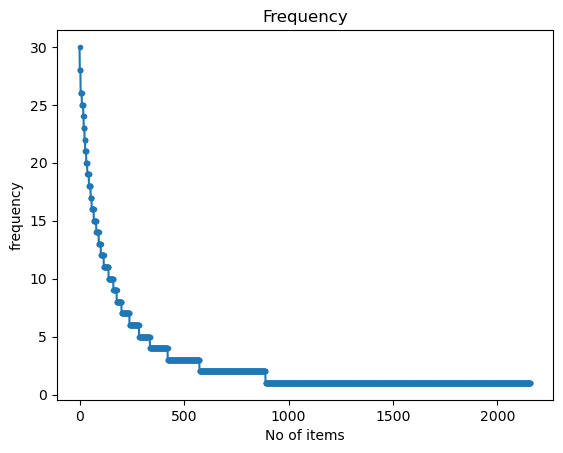

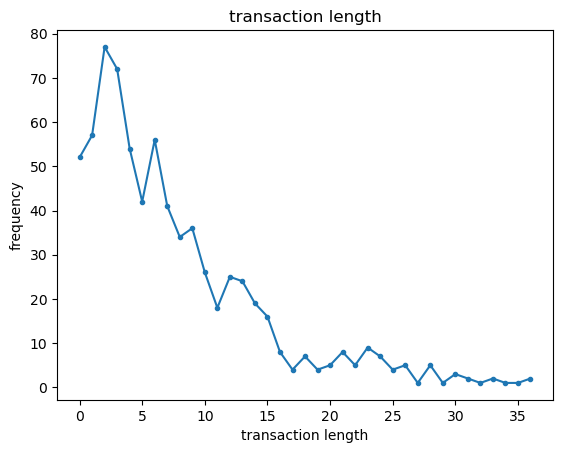

In [201]:
from PAMI.extras.dbStats import TransactionalDatabase as tds

obj = tds.TransactionalDatabase('td_freq_db_nostalgia.csv')
obj.run()
obj.printStats()
obj.plotGraphs()

Database size (total no of transactions) : 745
Number of items : 2446
Minimum Transaction Size : 1
Average Transaction Size : 8.410738255033557
Maximum Transaction Size : 46
Standard Deviation Transaction Size : 5.926429722323316
Variance in Transaction Sizes : 35.16977700801039
Sparsity : 0.9965614316210002


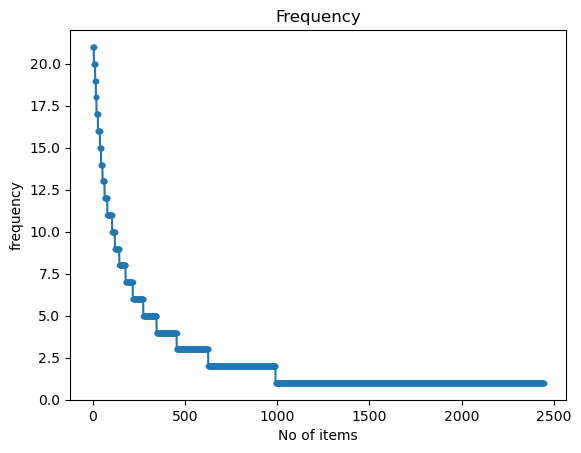

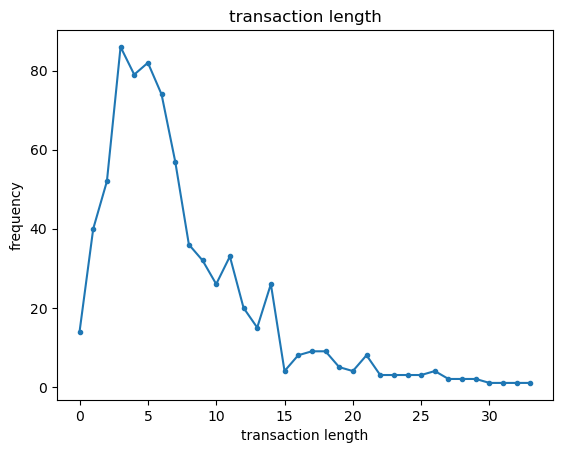

In [202]:
from PAMI.extras.dbStats import TransactionalDatabase as tds

obj = tds.TransactionalDatabase('td_freq_db_not nostalgia.csv')
obj.run()
obj.printStats()
obj.plotGraphs()

In [203]:
from PAMI.frequentPattern.basic import FPGrowth as alg
minSup=9
obj1 = alg.FPGrowth(iFile='td_freq_db_nostalgia.csv', minSup=minSup)
obj1.mine()
frequentPatternsDF_nostalgia = obj1.getPatternsAsDataFrame()
print('Total No of patterns: ' + str(len(frequentPatternsDF_nostalgia))) #print the total number of patterns
print('Runtime: ' + str(obj1.getRuntime())) #measure the runtime

Frequent patterns were generated successfully using frequentPatternGrowth algorithm
Total No of patterns: 180
Runtime: 0.01301121711730957


In [204]:
obj1.save('freq_patterns_nostalgia_minSup9.txt')
frequentPatternsDF_nostalgia

,Patterns,Support
0,find,9
1,down,9
2,few,9
3,its,9
4,sure,9
...,...,...
175,ever,28
176,would,28
177,will,28
178,go,28


In [205]:
from PAMI.frequentPattern.basic import FPGrowth as alg
minSup=9
obj2 = alg.FPGrowth(iFile='td_freq_db_not nostalgia.csv', minSup=minSup)
obj2.mine()
frequentPatternsDF_not_nostalgia = obj2.getPatternsAsDataFrame()
print('Total No of patterns: ' + str(len(frequentPatternsDF_not_nostalgia))) #print the total number of patterns
print('Runtime: ' + str(obj2.getRuntime())) #measure the runtime

Frequent patterns were generated successfully using frequentPatternGrowth algorithm
Total No of patterns: 144
Runtime: 0.007994890213012695


In [206]:
obj2.save('freq_patterns_not_nostalgia_minSup9.txt')
frequentPatternsDF_not_nostalgia

,Patterns,Support
0,favorites,9
1,special,9
2,soul,9
3,mind,9
4,60,9
...,...,...
139,every,21
140,loved,21
141,classic,21
142,them,21


In [207]:
import pandas as pd

#We group together all of the dataframes related to our found patterns
dfs = [frequentPatternsDF_not_nostalgia, frequentPatternsDF_nostalgia]


# Identify patterns that appear in more than one category
# Count how many times each pattern appears across all dataframes
pattern_counts = {}
for df in dfs:
    for pattern in df['Patterns']:
        if pattern not in pattern_counts:
            pattern_counts[pattern] = 1
        else:
            pattern_counts[pattern] += 1

# Filter out patterns that appear in more than one dataframe
unique_patterns = {pattern for pattern, count in pattern_counts.items() if count == 1}
# Calculate the total number of patterns across all categories
total_patterns_count = sum(len(df) for df in dfs)
# Calculate how many patterns were discarded
discarded_patterns_count = total_patterns_count - len(unique_patterns)

# For each category, filter the patterns to keep only the unique ones
filtered_dfs = []
for df in dfs:
    filtered_df = df[df['Patterns'].isin(unique_patterns)]
    filtered_dfs.append(filtered_df)

# Merge the filtered dataframes into a final dataframe
final_pattern_df = pd.concat(filtered_dfs, ignore_index=True)

# Sort by support
final_pattern_df = final_pattern_df.sort_values(by='Support', ascending=False)

# Display the final result
print(final_pattern_df)
# Print the number of discarded patterns
print(f"Number of patterns discarded: {discarded_patterns_count}")

      Patterns  Support
219       will       28
218      would       28
217       ever       28
216       wish       26
215         or       26
..         ...      ...
96       along        9
1      special        9
95    together        9
94        left        9
0    favorites        9

[220 rows x 2 columns]
Number of patterns discarded: 104


In [208]:
import pandas as pd
from sklearn.feature_extraction.text import CountVectorizer

# Convert 'text' column into term-document matrix using CountVectorizer
count_vect = CountVectorizer()
Y_tdm = count_vect.fit_transform(Y['comment'])  # Y['comment'] contains your text data
terms = count_vect.get_feature_names_out()  # Original terms in the vocabulary

# Tokenize the sentences into sets of unique words
Y['tokenized_text'] = Y['comment'].str.split().apply(set)

# Initialize the pattern matrix
pattern_matrix = pd.DataFrame(0, index=Y.index, columns=final_pattern_df['Patterns'])

# Iterate over each pattern and check if all words in the pattern are present in the tokenized sentence
for pattern in final_pattern_df['Patterns']:
    pattern_words = set(pattern.split())  # Tokenize pattern into words
    pattern_matrix[pattern] = Y['tokenized_text'].apply(lambda x: 1 if pattern_words.issubset(x) else 0)

# Convert the term-document matrix to a DataFrame for easy merging
tdm_df = pd.DataFrame(Y_tdm.toarray(), columns=terms, index=Y.index)

# Concatenate the original TDM and the pattern matrix to augment the features
augmented_df = pd.concat([tdm_df, pattern_matrix], axis=1)

augmented_df

,00,000,045,07,10,100,10m,11,11th,12,...,karen,place,records,until,tv,along,special,together,left,favorites
0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1495,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1496,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1497,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1498,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


### FAE Top-K

In [210]:
from PAMI.frequentPattern.topk import FAE as FAEtk
inputFile = 'td_freq_db_nostalgia.csv'

# Input file
inputFile = 'td_freq_db_nostalgia.csv'
seperator = '\t'

In [211]:
#k value to run
k_values = 500

print(f"\nRunning FAE Top-K with k={k_values}")
    
# Initialize the FAE Top-K algorithm
objfae1 = FAEtk.FAE(iFile=inputFile, k=k_values, sep=seperator)

# Start the mining process
objfae1.mine()
objfae1_pattern= objfae1.getPatternsAsDataFrame()
# Save the results to a separate file for each k
output_filename = f'frequentPatternsMinSupCount{k_values}.txt'
objfae1.save(outFile=output_filename)  # Save to file
    
print(f"Results for k={k_values} saved to {output_filename}")
print('Runtime: ' + str(objfae1.getRuntime()))
objfae1_pattern


Running FAE Top-K with k=500
 TopK frequent patterns were successfully generated using FAE algorithm.
Results for k=500 saved to frequentPatternsMinSupCount500.txt
Runtime: 0.08100509643554688


,Patterns,Support
0,favorite,30
1,ever,28
2,would,28
3,will,28
4,go,28
...,...,...
495,don house,4
496,god bless,4
497,brenda lee,4
498,august,3


In [ ]:
#k value to run
k_values = 1000

print(f"\nRunning FAE Top-K with k={k_values}")
    
# Initialize the FAE Top-K algorithm
objfae2 = FAEtk.FAE(iFile=inputFile, k=k_values, sep=seperator)

# Start the mining process
objfae2.mine()
objfae2_pattern= objfae2.getPatternsAsDataFrame()
# Save the results to a separate file for each k
output_filename = f'frequentPatternsMinSupCount{k_values}.txt'
objfae2.save(outFile=output_filename)  # Save to file
    
print(f"Results for k={k_values} saved to {output_filename}")
print('Runtime: ' + str(objfae2.getRuntime()))
objfae2_pattern

In [ ]:
#k value to run
k_values = 1500

print(f"\nRunning FAE Top-K with k={k_values}")
    
# Initialize the FAE Top-K algorithm
objfae3 = FAEtk.FAE(iFile=inputFile, k=k_values, sep=seperator)

# Start the mining process
objfae3.mine()
objfae3_pattern= objfae3.getPatternsAsDataFrame()

# Save the results to a separate file for each k
output_filename = f'frequentPatternsMinSupCount{k_values}.txt'
objfae3.save(outFile=output_filename)  # Save to file
    
print(f"Results for k={k_values} saved to {output_filename}")
print('Runtime: ' + str(objfae3.getRuntime()))
objfae3_pattern

*unfortunately my computer is not able to run FAE Top-K for k = 1000 and 1500 :(

### MaxFPGrowth

In [257]:
from PAMI.frequentPattern.maximal import MaxFPGrowth  as MaxFP #import the algorithm

minimumSupportCount = 3

objmax1 = MaxFP.MaxFPGrowth(iFile=inputFile, minSup=minimumSupportCount, sep='\t') #initialize
objmax1.mine()            #start the mining process

objmax1.save('maximalFrequentPatternsAtMinSupCount3.txt') #save the patterns

frequentPatternsDF= objmax1.getPatternsAsDataFrame() #get the generated frequent patterns as a dataframe
print('Total No of patterns: ' + str(len(frequentPatternsDF))) #print the total number of patterns
print('Runtime: ' + str(objmax1.getRuntime())) #measure the runtime

print('Memory (RSS): ' + str(objmax1.getMemoryRSS()))
print('Memory (USS): ' + str(objmax1.getMemoryUSS()))

objmax1_pattern= objmax1.getPatternsAsDataFrame()
objmax1_pattern

Maximal Frequent patterns were generated successfully using MaxFp-Growth algorithm 
Total No of patterns: 682
Runtime: 0.02700066566467285
Memory (RSS): 1302315008
Memory (USS): 1238958080


,Patterns,Support
0,skating,3
1,walker,3
2,scott,3
3,17 1987,3
4,stop,3
...,...,...
677,will such,4
678,ever only,3
679,would only,4
680,ever kid,3


In [259]:
from PAMI.frequentPattern.maximal import MaxFPGrowth  as MaxFP #import the algorithm

minimumSupportCount = 6

objmax2 = MaxFP.MaxFPGrowth(iFile=inputFile, minSup=minimumSupportCount, sep='\t') #initialize
objmax2.mine()            #start the mining process

objmax2.save('maximalFrequentPatternsAtMinSupCount6.txt') #save the patterns

frequentPatternsDF= objmax2.getPatternsAsDataFrame() #get the generated frequent patterns as a dataframe
print('Total No of patterns: ' + str(len(frequentPatternsDF))) #print the total number of patterns
print('Runtime: ' + str(objmax2.getRuntime())) #measure the runtime

print('Memory (RSS): ' + str(objmax2.getMemoryRSS()))
print('Memory (USS): ' + str(objmax2.getMemoryUSS()))

objmax2_pattern= objmax2.getPatternsAsDataFrame()
objmax2_pattern

Maximal Frequent patterns were generated successfully using MaxFp-Growth algorithm 
Total No of patterns: 274
Runtime: 0.014028072357177734
Memory (RSS): 1302659072
Memory (USS): 1239302144


,Patterns,Support
0,1973,6
1,looking,6
2,actually,6
3,fast,6
4,innocent,6
...,...,...
269,only,26
270,kid,26
271,would,28
272,ever,28


In [261]:
from PAMI.frequentPattern.maximal import MaxFPGrowth  as MaxFP #import the algorithm

minimumSupportCount = 9

objmax3 = MaxFP.MaxFPGrowth(iFile=inputFile, minSup=minimumSupportCount, sep='\t') #initialize
objmax3.mine()            #start the mining process

objmax3.save('maximalFrequentPatternsAtMinSupCount9.txt') #save the patterns

frequentPatternsDF= objmax3.getPatternsAsDataFrame() #get the generated frequent patterns as a dataframe
print('Total No of patterns: ' + str(len(frequentPatternsDF))) #print the total number of patterns
print('Runtime: ' + str(objmax3.getRuntime())) #measure the runtime

print('Memory (RSS): ' + str(objmax3.getMemoryRSS()))
print('Memory (USS): ' + str(objmax3.getMemoryUSS()))

objmax3_pattern= objmax3.getPatternsAsDataFrame()
objmax3_pattern

Maximal Frequent patterns were generated successfully using MaxFp-Growth algorithm 
Total No of patterns: 176
Runtime: 0.010999917984008789
Memory (RSS): 1302761472
Memory (USS): 1239404544


,Patterns,Support
0,karen,9
1,right,9
2,place,9
3,records,9
4,yes,9
...,...,...
171,go,28
172,will,28
173,would,28
174,ever,28


### 5.5 Dimensionality Reduction


In [264]:
#Applying dimensionality reduction with only the document-term frequency data
from sklearn.decomposition import PCA
from sklearn.manifold import TSNE
import umap
import matplotlib.pyplot as plt

#This might take a couple of minutes to execute
# Apply PCA, t-SNE, and UMAP to the data
Y_pca_tdm = PCA(n_components=2).fit_transform(tdm_df.values)
Y_tsne_tdm = TSNE(n_components=2).fit_transform(tdm_df.values)
Y_umap_tdm = umap.UMAP(n_components=2).fit_transform(tdm_df.values)

In [265]:
Y_pca_tdm.shape

(1499, 2)

In [266]:
Y_tsne_tdm.shape

(1499, 2)

In [267]:
Y_umap_tdm.shape

(1499, 2)

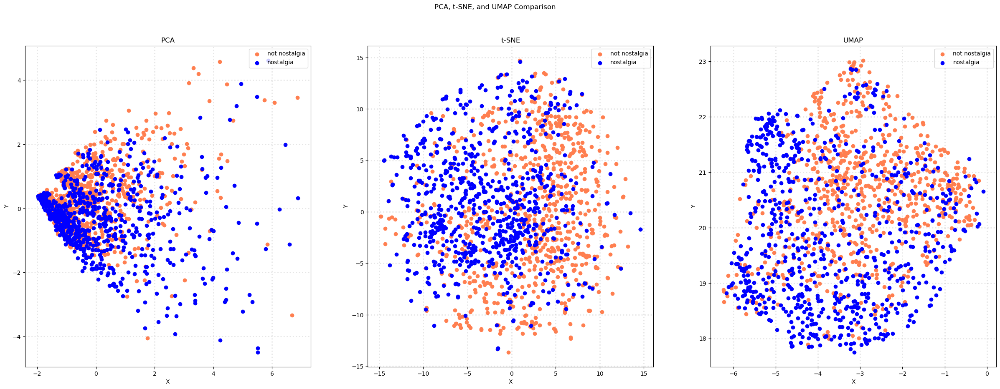

In [268]:
# Plot the results in subplots
col = ['coral', 'blue']
categories = Y['sentiment'].unique() 

fig, axes = plt.subplots(1, 3, figsize=(30, 10))  # Create 3 subplots for PCA, t-SNE, and UMAP
fig.suptitle('PCA, t-SNE, and UMAP Comparison')

# Define a function to create a scatter plot for each method
def plot_scatter(ax, Y_reduced, title):
    for c, category in zip(col, categories):
        xs = Y_reduced[Y['sentiment'] == category].T[0]
        ys = Y_reduced[Y['sentiment'] == category].T[1]
        ax.scatter(xs, ys, c=c, marker='o', label=category)
    
    ax.grid(color='gray', linestyle=':', linewidth=2, alpha=0.2)
    ax.set_title(title)
    ax.set_xlabel('X')
    ax.set_ylabel('Y')
    ax.legend(loc='upper right')

# Step 4: Create scatter plots for PCA, t-SNE, and UMAP
plot_scatter(axes[0], Y_pca_tdm, 'PCA')
plot_scatter(axes[1], Y_tsne_tdm, 't-SNE')
plot_scatter(axes[2], Y_umap_tdm, 'UMAP')

plt.show()

We can observe quite significant intermixing between both sentiments in all 3 plots above. This is likely because most of the words are not unique to a particular sentiment.

In [270]:
# now to try for pattern-augmented data

#This might take a couple of minutes to execute
#Applying dimensionality reduction with both the document-term frequency data and the pattern derived data
# Apply PCA, t-SNE, and UMAP to the data
Y_pca_aug = PCA(n_components=2).fit_transform(augmented_df.values)
Y_tsne_aug = TSNE(n_components=2).fit_transform(augmented_df.values)
Y_umap_aug = umap.UMAP(n_components=2).fit_transform(augmented_df.values)

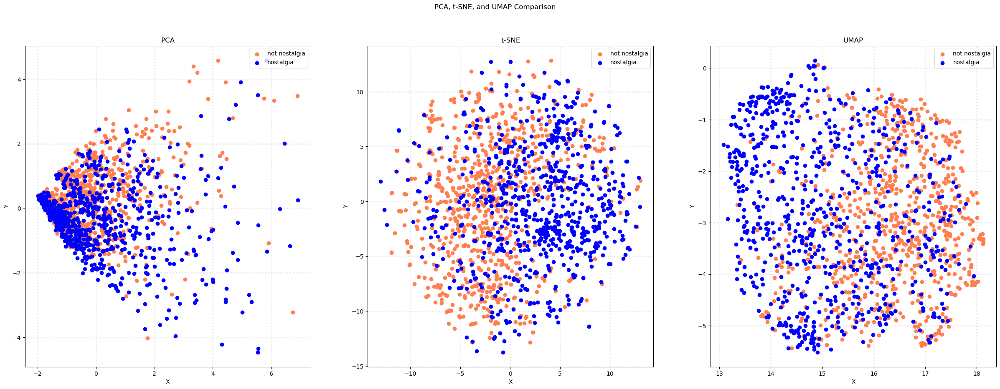

In [271]:
# Plot the results in subplots
col = ['coral', 'blue']
categories = Y['sentiment'].unique() 

fig, axes = plt.subplots(1, 3, figsize=(30, 10))  # Create 3 subplots for PCA, t-SNE, and UMAP
fig.suptitle('PCA, t-SNE, and UMAP Comparison')

# Define a function to create a scatter plot for each method
def plot_scatter(ax, Y_reduced, title):
    for c, category in zip(col, categories):
        xs = Y_reduced[Y['sentiment'] == category].T[0]
        ys = Y_reduced[Y['sentiment'] == category].T[1]
        ax.scatter(xs, ys, c=c, marker='o', label=category)
    
    ax.grid(color='gray', linestyle=':', linewidth=2, alpha=0.2)
    ax.set_title(title)
    ax.set_xlabel('X')
    ax.set_ylabel('Y')
    ax.legend(loc='upper right')

# Create scatter plots for PCA, t-SNE, and UMAP
plot_scatter(axes[0], Y_pca_aug, 'PCA')
plot_scatter(axes[1], Y_tsne_aug, 't-SNE')
plot_scatter(axes[2], Y_umap_aug, 'UMAP')

plt.show()

In all 3 plots, there is hardly any difference in the visualization. This is likely because the original document-term matrix dominates what the algorithm captures, much like for the previous dataset.

In [273]:
Y_pca_3d = PCA(n_components=3).fit_transform(tdm_df.values)
Y_tsne_3d = TSNE(n_components=3).fit_transform(tdm_df.values)
Y_umap_3d = umap.UMAP(n_components=3).fit_transform(tdm_df.values)

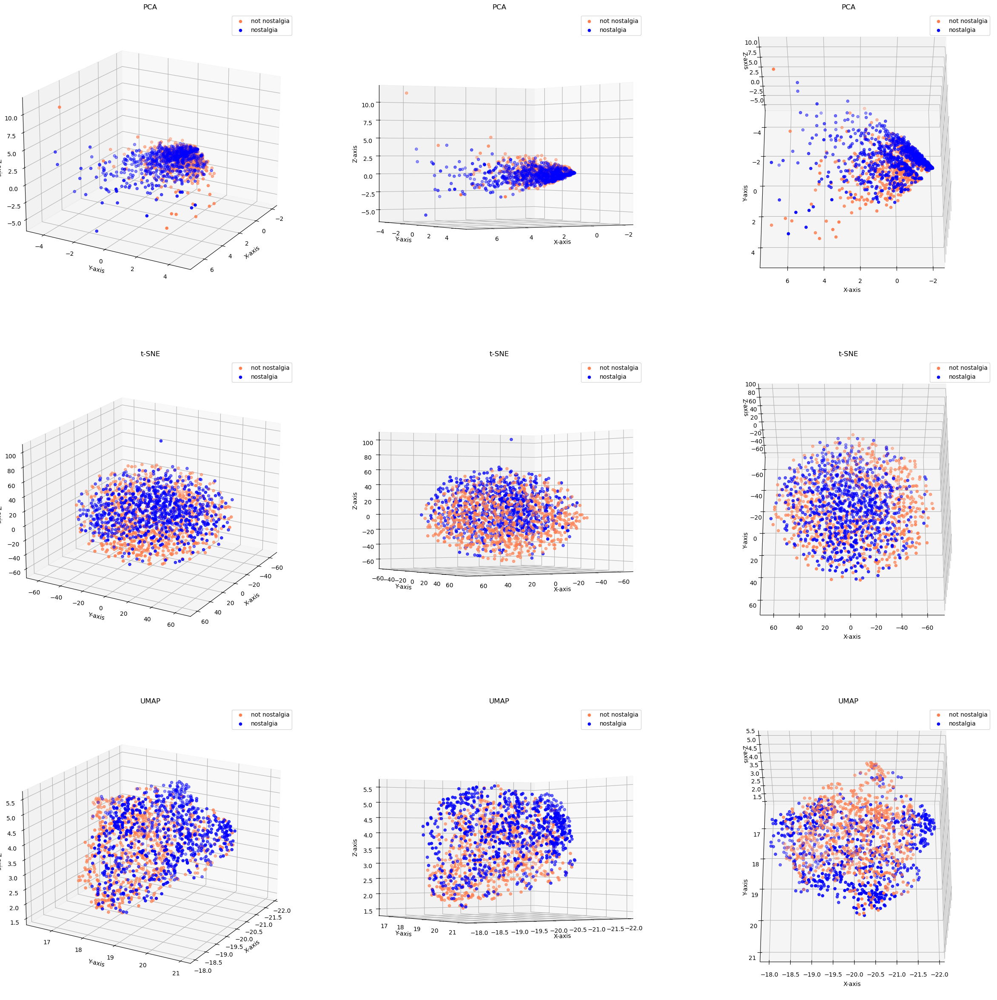

In [274]:
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D  # Required for 3D plotting

col = ['coral', 'blue', 'black', 'orange']
categories = Y['sentiment'].unique() 

fig = plt.figure(figsize=(30, 30))  # Create a larger figure to hold 9 subplots

# Create 9 subplots, 3 per technique, each with a different view angle
ax1 = fig.add_subplot(331, projection='3d')  # PCA view 1
ax2 = fig.add_subplot(332, projection='3d')  # PCA view 2
ax3 = fig.add_subplot(333, projection='3d')  # PCA view 3
ax4 = fig.add_subplot(334, projection='3d')  # t-SNE view 1
ax5 = fig.add_subplot(335, projection='3d')  # t-SNE view 2
ax6 = fig.add_subplot(336, projection='3d')  # t-SNE view 3
ax7 = fig.add_subplot(337, projection='3d')  # UMAP view 1
ax8 = fig.add_subplot(338, projection='3d')  # UMAP view 2
ax9 = fig.add_subplot(339, projection='3d')  # UMAP view 3

def plot_3d_scatter(ax, Y_reduced, title):
    for c, category in zip(col, categories):
        # Filter data for each category
        xs = Y_reduced[Y['sentiment'] == category][:, 0]  # First component
        ys = Y_reduced[Y['sentiment'] == category][:, 1]  # Second component
        zs = Y_reduced[Y['sentiment'] == category][:, 2]  # Third component
        ax.scatter(xs, ys, zs, c=c, marker='o', label=category)

    ax.grid(color='gray', linestyle=':', linewidth=2, alpha=0.2)
    ax.set_title(title)
    ax.set_xlabel('X-axis')
    ax.set_ylabel('Y-axis')
    ax.set_zlabel('Z-axis')
    ax.legend(loc='upper right')

# Plot PCA in the first row with different camera angles
plot_3d_scatter(ax1, Y_pca_3d, 'PCA')
ax1.view_init(elev=20, azim=30)
plot_3d_scatter(ax2, Y_pca_3d, 'PCA')
ax2.view_init(elev=0, azim=60)
plot_3d_scatter(ax3, Y_pca_3d, 'PCA')
ax3.view_init(elev=60, azim=90)

# Plot t-SNE in the second row with different camera angles
plot_3d_scatter(ax4, Y_tsne_3d, 't-SNE')
ax4.view_init(elev=20, azim=30)
plot_3d_scatter(ax5, Y_tsne_3d, 't-SNE')
ax5.view_init(elev=0, azim=60)
plot_3d_scatter(ax6, Y_tsne_3d, 't-SNE')
ax6.view_init(elev=60, azim=90)

# Plot UMAP in the third row with different camera angles
plot_3d_scatter(ax7, Y_umap_3d, 'UMAP')
ax7.view_init(elev=20, azim=30)
plot_3d_scatter(ax8, Y_umap_3d, 'UMAP')
ax8.view_init(elev=0, azim=60)
plot_3d_scatter(ax9, Y_umap_3d, 'UMAP')
ax9.view_init(elev=60, azim=90)

plt.show()


We can more clearly see that although there is still intermixing, there are chunks of areas where the categories are more evidently separated.

### 5.6 Discretization and Binarization


In [277]:
from sklearn import preprocessing, metrics, decomposition, pipeline, dummy

In [278]:
mlb = preprocessing.LabelBinarizer()

In [279]:
mlb.fit(Y.sentiment_numeric)

LabelBinarizer()

In [280]:
Y['bin_category'] = mlb.transform(Y['sentiment_numeric']).tolist()

In [281]:
Y[0:9]

,sentiment,comment,sentiment_numeric,unigrams,tokenized_text,bin_category
0,not nostalgia,He was a singer with a golden voice that I lov...,0.0,"[He, was, a, singer, with, a, golden, voice, t...","{now., golden, Thank, vouch, You, singer, grea...",[0]
1,nostalgia,The mist beautiful voice ever I listened to hi...,1.0,"[The, mist, beautiful, voice, ever, I, listene...","{beautiful, forgotten, him, kid, listened, whe...",[1]
2,nostalgia,I have most of Mr. Reeves songs. Always love ...,1.0,"[I, have, most, of, Mr., Reeves, songs, ., Alw...","{Mr., smooth, great, forgot, how, Reeves, age,...",[1]
3,not nostalgia,30 day leave from 1st tour in Viet Nam to conv...,0.0,"[30, day, leave, from, 1st, tour, in, Viet, Na...","{pray, are, Viet, Thank, man, December, 2nd, t...",[0]
4,nostalgia,listening to his songs reminds me of my mum wh...,1.0,"[listening, to, his, songs, reminds, me, of, m...","{his, reminds, of, who, him, played, songs, ev...",[1]
5,nostalgia,"Every time I heard this song as a child, I use...",1.0,"[Every, time, I, heard, this, song, as, a, chi...","{souls., your, cry....because, Jim, used, touc...",[1]
6,nostalgia,"My dad loved listening to Jim Reeves, when I w...",1.0,"[My, dad, loved, listening, to, Jim, Reeves, ,...","{teenager, 70's, My, how, Jim, changes, for, d...",[1]
7,nostalgia,i HAVE ALSO LISTENED TO Jim Reeves since child...,1.0,"[i, HAVE, ALSO, LISTENED, TO, Jim, Reeves, sin...","{am, puts, comes, Jim, ., ALSO, feeling, Reeve...",[1]
8,not nostalgia,Wherever you are you always in my heart,0.0,"[Wherever, you, are, you, always, in, my, heart]","{are, in, always, heart, you, Wherever, my}",[0]


In [282]:
# Similarly, it works for 'sentiment' directly as well
mlb = preprocessing.LabelBinarizer()
mlb.fit(Y.sentiment)
Y['bin_category'] = mlb.transform(Y['sentiment']).tolist()

In [283]:
Y[0:9]

,sentiment,comment,sentiment_numeric,unigrams,tokenized_text,bin_category
0,not nostalgia,He was a singer with a golden voice that I lov...,0.0,"[He, was, a, singer, with, a, golden, voice, t...","{now., golden, Thank, vouch, You, singer, grea...",[1]
1,nostalgia,The mist beautiful voice ever I listened to hi...,1.0,"[The, mist, beautiful, voice, ever, I, listene...","{beautiful, forgotten, him, kid, listened, whe...",[0]
2,nostalgia,I have most of Mr. Reeves songs. Always love ...,1.0,"[I, have, most, of, Mr., Reeves, songs, ., Alw...","{Mr., smooth, great, forgot, how, Reeves, age,...",[0]
3,not nostalgia,30 day leave from 1st tour in Viet Nam to conv...,0.0,"[30, day, leave, from, 1st, tour, in, Viet, Na...","{pray, are, Viet, Thank, man, December, 2nd, t...",[1]
4,nostalgia,listening to his songs reminds me of my mum wh...,1.0,"[listening, to, his, songs, reminds, me, of, m...","{his, reminds, of, who, him, played, songs, ev...",[0]
5,nostalgia,"Every time I heard this song as a child, I use...",1.0,"[Every, time, I, heard, this, song, as, a, chi...","{souls., your, cry....because, Jim, used, touc...",[0]
6,nostalgia,"My dad loved listening to Jim Reeves, when I w...",1.0,"[My, dad, loved, listening, to, Jim, Reeves, ,...","{teenager, 70's, My, how, Jim, changes, for, d...",[0]
7,nostalgia,i HAVE ALSO LISTENED TO Jim Reeves since child...,1.0,"[i, HAVE, ALSO, LISTENED, TO, Jim, Reeves, sin...","{am, puts, comes, Jim, ., ALSO, feeling, Reeve...",[0]
8,not nostalgia,Wherever you are you always in my heart,0.0,"[Wherever, you, are, you, always, in, my, heart]","{are, in, always, heart, you, Wherever, my}",[1]


# 6. Data Exploration

In [285]:
# We retrieve 3 sentences for a random record
document_to_transform_1 = []
random_record_1 = Y.iloc[50]
random_record_1 = random_record_1['comment']
document_to_transform_1.append(random_record_1)

document_to_transform_2 = []
random_record_2 = Y.iloc[100]
random_record_2 = random_record_2['comment']
document_to_transform_2.append(random_record_2)

document_to_transform_3 = []
random_record_3 = Y.iloc[150]
random_record_3 = random_record_3['comment']
document_to_transform_3.append(random_record_3)

In [286]:
# take a look at the 3 comments
print(document_to_transform_1)
print(document_to_transform_2)
print(document_to_transform_3)

['If I remember correctly, this song came out after Mr. Reeves passed away. I was about 10 years old when the disc jockey said that the news just came over the wire that he died in a plane crash.']
['i guess most of us leave it too late before we tell someone just how much we really love them']
['my name is thomas but know by tommy and my wifes name is laura and i always sing this to her']


In [287]:
from sklearn.preprocessing import binarize

# Transform sentence with Vectorizers
document_vector_count_1 = count_vect.transform(document_to_transform_1)
document_vector_count_2 = count_vect.transform(document_to_transform_2)
document_vector_count_3 = count_vect.transform(document_to_transform_3)

# Binarize vectors to simplify: 0 for abscence, 1 for prescence
document_vector_count_1_bin = binarize(document_vector_count_1)
document_vector_count_2_bin = binarize(document_vector_count_2)
document_vector_count_3_bin = binarize(document_vector_count_3)

# print vectors
print("Let's take a look at the count vectors:")
print(document_vector_count_1.todense())
print(document_vector_count_2.todense())
print(document_vector_count_3.todense())

Let's take a look at the count vectors:
[[0 0 0 ... 0 0 0]]
[[0 0 0 ... 0 0 0]]
[[0 0 0 ... 0 0 0]]


In [288]:
from sklearn.metrics.pairwise import cosine_similarity

# Calculate Cosine Similarity
cos_sim_count_1_2 = cosine_similarity(document_vector_count_1, document_vector_count_2, dense_output=True)
cos_sim_count_1_3 = cosine_similarity(document_vector_count_1, document_vector_count_3, dense_output=True)
cos_sim_count_2_3 = cosine_similarity(document_vector_count_2, document_vector_count_3, dense_output=True)

cos_sim_count_1_1 = cosine_similarity(document_vector_count_1, document_vector_count_1, dense_output=True)
cos_sim_count_2_2 = cosine_similarity(document_vector_count_2, document_vector_count_2, dense_output=True)
cos_sim_count_3_3 = cosine_similarity(document_vector_count_3, document_vector_count_3, dense_output=True)

# Print 
print("Cosine Similarity using count bw 1 and 2: %(x)f" %{"x":cos_sim_count_1_2})
print("Cosine Similarity using count bw 1 and 3: %(x)f" %{"x":cos_sim_count_1_3})
print("Cosine Similarity using count bw 2 and 3: %(x)f" %{"x":cos_sim_count_2_3})

print("Cosine Similarity using count bw 1 and 1: %(x)f" %{"x":cos_sim_count_1_1})
print("Cosine Similarity using count bw 2 and 2: %(x)f" %{"x":cos_sim_count_2_2})
print("Cosine Similarity using count bw 3 and 3: %(x)f" %{"x":cos_sim_count_3_3})

Cosine Similarity using count bw 1 and 2: 0.032174
Cosine Similarity using count bw 1 and 3: 0.027864
Cosine Similarity using count bw 2 and 3: 0.000000
Cosine Similarity using count bw 1 and 1: 1.000000
Cosine Similarity using count bw 2 and 2: 1.000000
Cosine Similarity using count bw 3 and 3: 1.000000


C:\Users\marcu\AppData\Local\Temp\ipykernel_22900\452772485.py:13: DeprecationWarning:

Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)

C:\Users\marcu\AppData\Local\Temp\ipykernel_22900\452772485.py:14: DeprecationWarning:

Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)

C:\Users\marcu\AppData\Local\Temp\ipykernel_22900\452772485.py:15: DeprecationWarning:

Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)

C:\Users\marcu\AppData\Local\Temp\ipykernel_22900\452772485.py:17: DeprecationWarning:

Conversion of an array with ndim > 0 to a 

As expected, cosine similarity between a sentence and itself is 1, but its fun to note that between 2 and 3 it is 0, indicating that the sentences are entirely different.

# 7. Data Classification


In [291]:
#Model with only the document-term frequency data
import pandas as pd
from sklearn.feature_extraction.text import CountVectorizer
from sklearn.model_selection import train_test_split
from sklearn.naive_bayes import MultinomialNB
from sklearn.metrics import classification_report, accuracy_score

# Create a mapping from numerical labels to category names
category_mapping = dict(Y[['sentiment_numeric', 'sentiment']].drop_duplicates().values)

# Convert the numerical category labels to text labels
target_names = [category_mapping[label] for label in sorted(category_mapping.keys())]

# Split the data into training and testing sets (70% train, 30% test)
X_train, X_test, y_train, y_test = train_test_split(tdm_df, Y['sentiment_numeric'], test_size=0.3, random_state=42)

In [292]:
X_train

,00,000,045,07,10,100,10m,11,11th,12,...,yours,yourself,youth,youthful,youtube,yrs,yuo,yup,zealand,zulus
486,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
528,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
200,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
890,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
845,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1131,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1295,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
861,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1460,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


In [293]:
X_test

,00,000,045,07,10,100,10m,11,11th,12,...,yours,yourself,youth,youthful,youtube,yrs,yuo,yup,zealand,zulus
1117,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1396,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
423,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
414,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
452,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1084,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
991,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
651,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,2,0,0,0,0,0
1188,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


In [294]:
# Train the Naive Bayes classifier
nb_classifier = MultinomialNB()
nb_classifier.fit(X_train, y_train)

# Make predictions on the test set
y_pred = nb_classifier.predict(X_test)

# Evaluate the classifier
print("Accuracy:", accuracy_score(y_test, y_pred))
print("\nClassification Report:\n", classification_report(y_test, y_pred, target_names=target_names, digits=4))

Accuracy: 0.8688888888888889

Classification Report:
                precision    recall  f1-score   support

not nostalgia     0.9389    0.7788    0.8514       217
    nostalgia     0.8222    0.9528    0.8827       233

     accuracy                         0.8689       450
    macro avg     0.8806    0.8658    0.8670       450
 weighted avg     0.8785    0.8689    0.8676       450



In [295]:
#Model with the augmented data
import pandas as pd
from sklearn.feature_extraction.text import CountVectorizer
from sklearn.model_selection import train_test_split
from sklearn.naive_bayes import MultinomialNB
from sklearn.metrics import classification_report, accuracy_score

# Create a mapping from numerical labels to category names
category_mapping = dict(Y[['sentiment_numeric', 'sentiment']].drop_duplicates().values)

# Convert the numerical category labels to text labels
target_names = [category_mapping[label] for label in sorted(category_mapping.keys())]

# Split the data into training and testing sets (70% train, 30% test)
X_train, X_test, y_train, y_test = train_test_split(augmented_df, Y['sentiment_numeric'], test_size=0.3, random_state=42)

In [296]:
X_train

,00,000,045,07,10,100,10m,11,11th,12,...,karen,place,records,until,tv,along,special,together,left,favorites
486,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
528,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
200,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
890,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
845,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1131,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,1,0
1295,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
861,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1460,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


In [297]:
X_test

,00,000,045,07,10,100,10m,11,11th,12,...,karen,place,records,until,tv,along,special,together,left,favorites
1117,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1396,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
423,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
414,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
452,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1084,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
991,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
651,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1188,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


In [298]:
# Train the Naive Bayes classifier
nb_classifier = MultinomialNB()
nb_classifier.fit(X_train, y_train)

# Make predictions on the test set
y_pred = nb_classifier.predict(X_test)

# Evaluate the classifier
print("Accuracy:", accuracy_score(y_test, y_pred))
print("\nClassification Report:\n", classification_report(y_test, y_pred, target_names=target_names, digits=4))

Accuracy: 0.8644444444444445

Classification Report:
                precision    recall  f1-score   support

not nostalgia     0.9333    0.7742    0.8463       217
    nostalgia     0.8185    0.9485    0.8787       233

     accuracy                         0.8644       450
    macro avg     0.8759    0.8613    0.8625       450
 weighted avg     0.8739    0.8644    0.8631       450



It is interesting to note that adding the pattern matrix actually decreases the overall accuracy of the model, which may possibly be because the additional info introduces noise or redundant features.

# TF-IDF Tokenization

In [301]:
from sklearn.feature_extraction.text import TfidfVectorizer
tfidf_vectorizer = TfidfVectorizer()

# Fit and transform the tokenized text to generate TF-IDF features
tfidf_matrix = tfidf_vectorizer.fit_transform(Y['comment'])

# Convert the result to a DataFrame for easier viewing
tfidf_df = pd.DataFrame(tfidf_matrix.toarray(), columns=tfidf_vectorizer.get_feature_names_out())

# Display the TF-IDF DataFrame
print(tfidf_df)

       00  000  045   07   10  100  10m   11  11th   12  ...  yours  yourself  \
0     0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0   0.0  0.0  ...    0.0       0.0   
1     0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0   0.0  0.0  ...    0.0       0.0   
2     0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0   0.0  0.0  ...    0.0       0.0   
3     0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0   0.0  0.0  ...    0.0       0.0   
4     0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0   0.0  0.0  ...    0.0       0.0   
...   ...  ...  ...  ...  ...  ...  ...  ...   ...  ...  ...    ...       ...   
1494  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0   0.0  0.0  ...    0.0       0.0   
1495  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0   0.0  0.0  ...    0.0       0.0   
1496  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0   0.0  0.0  ...    0.0       0.0   
1497  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0   0.0  0.0  ...    0.0       0.0   
1498  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0   0.0  0.0  ...    0.0       0.0   

      youth  youthful  yout

# Naive-Bayes Classifier

**MultinomialNB for Word Frequency**

In [304]:
#Model with only the document-term frequency data
import pandas as pd
from sklearn.feature_extraction.text import CountVectorizer
from sklearn.model_selection import train_test_split
from sklearn.naive_bayes import MultinomialNB, GaussianNB, BernoulliNB
from sklearn.metrics import classification_report, accuracy_score

# Create a mapping from numerical labels to category names
category_mapping = dict(Y[['sentiment_numeric', 'sentiment']].drop_duplicates().values)

# Convert the numerical category labels to text labels
target_names = [category_mapping[label] for label in sorted(category_mapping.keys())]

# Split the data into training and testing sets (70% train, 30% test)
X_train, X_test, y_train, y_test = train_test_split(tdm_df, Y['sentiment_numeric'], test_size=0.3, random_state=42)

In [305]:
# Train the Naive Bayes classifier
nb_classifier = MultinomialNB()
nb_classifier.fit(X_train, y_train)

# Make predictions on the test set
y_pred = nb_classifier.predict(X_test)

# Evaluate the classifier
print("Accuracy:", accuracy_score(y_test, y_pred))
print("\nClassification Report:\n", classification_report(y_test, y_pred, target_names=target_names, digits=4))

Accuracy: 0.8688888888888889

Classification Report:
                precision    recall  f1-score   support

not nostalgia     0.9389    0.7788    0.8514       217
    nostalgia     0.8222    0.9528    0.8827       233

     accuracy                         0.8689       450
    macro avg     0.8806    0.8658    0.8670       450
 weighted avg     0.8785    0.8689    0.8676       450



**MultinomialNB, GaussianNB and BernoulliNB for TD-IDF Features**

In [307]:
# Create a mapping from numerical labels to category names
category_mapping = dict(Y[['sentiment_numeric', 'sentiment']].drop_duplicates().values)

# Convert the numerical category labels to text labels
target_names = [category_mapping[label] for label in sorted(category_mapping.keys())]

# Split the data into training and testing sets (70% train, 30% test)
X_train_tfidf, X_test_tfidf, y_train, y_test = train_test_split(tfidf_df, Y['sentiment_numeric'], test_size=0.3, random_state=42)

# Train the Naive Bayes classifier using TF-IDF features
nb_classifier_tfidf = MultinomialNB()
nb_classifier_tfidf.fit(X_train_tfidf, y_train)

# Make predictions on the test set
y_pred_tfidf = nb_classifier_tfidf.predict(X_test_tfidf)

# Evaluate the classifier
print("Accuracy with TF-IDF:", accuracy_score(y_test, y_pred_tfidf))
print("\nClassification Report with TF-IDF:\n", classification_report(y_test, y_pred_tfidf, target_names=target_names, digits=4))

Accuracy with TF-IDF: 0.8622222222222222

Classification Report with TF-IDF:
                precision    recall  f1-score   support

not nostalgia     0.9379    0.7650    0.8426       217
    nostalgia     0.8132    0.9528    0.8775       233

     accuracy                         0.8622       450
    macro avg     0.8755    0.8589    0.8601       450
 weighted avg     0.8733    0.8622    0.8607       450



In [308]:
category_mapping = dict(Y[['sentiment_numeric', 'sentiment']].drop_duplicates().values)

# Convert the numerical category labels to text labels
target_names = [category_mapping[label] for label in sorted(category_mapping.keys())]

# Split the data into training and testing sets (70% train, 30% test)
X_train_tfidf, X_test_tfidf, y_train, y_test = train_test_split(tfidf_df, Y['sentiment_numeric'], test_size=0.3, random_state=42)

# Train the Gaussian Naive Bayes classifier using TF-IDF features
# Note: GaussianNB requires input data to be in dense format
nb_classifier_gaussian = GaussianNB()
nb_classifier_gaussian.fit(X_train_tfidf, y_train)

# Make predictions on the test set
y_pred_gaussian = nb_classifier_gaussian.predict(X_test_tfidf)

# Evaluate the Gaussian Naive Bayes classifier
print("Accuracy with Gaussian Naive Bayes:", accuracy_score(y_test, y_pred_gaussian))
print("\nClassification Report with Gaussian Naive Bayes:\n", classification_report(y_test, y_pred_gaussian, target_names=target_names, digits=4))

Accuracy with Gaussian Naive Bayes: 0.6577777777777778

Classification Report with Gaussian Naive Bayes:
                precision    recall  f1-score   support

not nostalgia     0.7006    0.5069    0.5882       217
    nostalgia     0.6348    0.7983    0.7072       233

     accuracy                         0.6578       450
    macro avg     0.6677    0.6526    0.6477       450
 weighted avg     0.6666    0.6578    0.6498       450



In [309]:
category_mapping = dict(Y[['sentiment_numeric', 'sentiment']].drop_duplicates().values)

# Convert the numerical category labels to text labels
target_names = [category_mapping[label] for label in sorted(category_mapping.keys())]

# Split the data into training and testing sets (70% train, 30% test)
X_train_tfidf, X_test_tfidf, y_train, y_test = train_test_split(tfidf_df, Y['sentiment_numeric'], test_size=0.3, random_state=42)

# Train the Bernoulli Naive Bayes classifier using TF-IDF features
nb_classifier_bernoulli = BernoulliNB()
nb_classifier_bernoulli.fit(X_train_tfidf, y_train)

# Make predictions on the test set
y_pred_bernoulli = nb_classifier_bernoulli.predict(X_test_tfidf)

# Evaluate the Bernoulli Naive Bayes classifier
print("Accuracy with Bernoulli Naive Bayes:", accuracy_score(y_test, y_pred_bernoulli))
print("\nClassification Report with Bernoulli Naive Bayes:\n", classification_report(y_test, y_pred_bernoulli, target_names=target_names, digits=4))

Accuracy with Bernoulli Naive Bayes: 0.8844444444444445

Classification Report with Bernoulli Naive Bayes:
                precision    recall  f1-score   support

not nostalgia     0.9275    0.8249    0.8732       217
    nostalgia     0.8521    0.9399    0.8939       233

     accuracy                         0.8844       450
    macro avg     0.8898    0.8824    0.8835       450
 weighted avg     0.8885    0.8844    0.8839       450



We can see after running 3 different Naive-Bayes Classifiers on the TD-IDF features that BernoulliNB performs the best. This is because the data features for this data set are binary (nostalgia/not nostalgia). 

When compared against the MultinomialNB performed on the term document from word frequency features, we can see that the Bernoulli Naive-Bayes Classifier performed better, with an accuracy of 88.4% against 86.9%.

This suggests that unique or rare words in the comment are actually better indicators of whether a comment is nostalgia or not, as opposed to frequencies of words. As YouTube comments are shorter and concise, the frequency of terms may not vary significantly, and rather the presence of certain keywords. Additionally, short comments tend to result in a sparser feature set, which aligns well with how the Bernoulli classifer processes input by using presence of terms rather than their counts.

## New Meaningful Data Visualizations

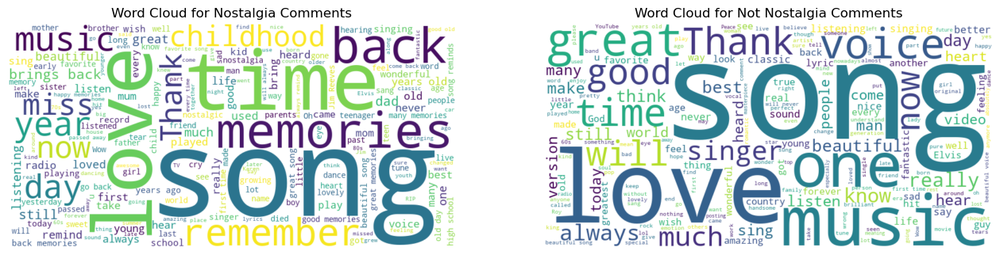

In [312]:
import matplotlib.pyplot as plt
from wordcloud import WordCloud

# Separate comments based on 'sentiment'
nostalgia_comments = ' '.join(Y[Y['sentiment'] == 'nostalgia']['comment'])
not_nostalgia_comments = ' '.join(Y[Y['sentiment'] == 'not nostalgia']['comment'])

# Generate word cloud for "nostalgia"
nostalgia_wordcloud = WordCloud(width=800, height=400, background_color='white').generate(nostalgia_comments)

# Generate word cloud for "not nostalgia"
not_nostalgia_wordcloud = WordCloud(width=800, height=400, background_color='white').generate(not_nostalgia_comments)

# Plot both word clouds side by side
plt.figure(figsize=(16, 8))

# Plot for nostalgia
plt.subplot(1, 2, 1)
plt.imshow(nostalgia_wordcloud, interpolation='bilinear')
plt.axis('off')
plt.title("Word Cloud for Nostalgia Comments")

# Plot for not nostalgia
plt.subplot(1, 2, 2)
plt.imshow(not_nostalgia_wordcloud, interpolation='bilinear')
plt.axis('off')
plt.title("Word Cloud for Not Nostalgia Comments")

plt.show()


This allows for a more visual and easy-on-the-eyes method to visualise words that have the most frequency. Whilst there are many similarities, we can see clearly that words such as 'time', 'memories', 'childhood' are words frequency associated with the past and hence are more present in comments classified as 'nostalgia'.

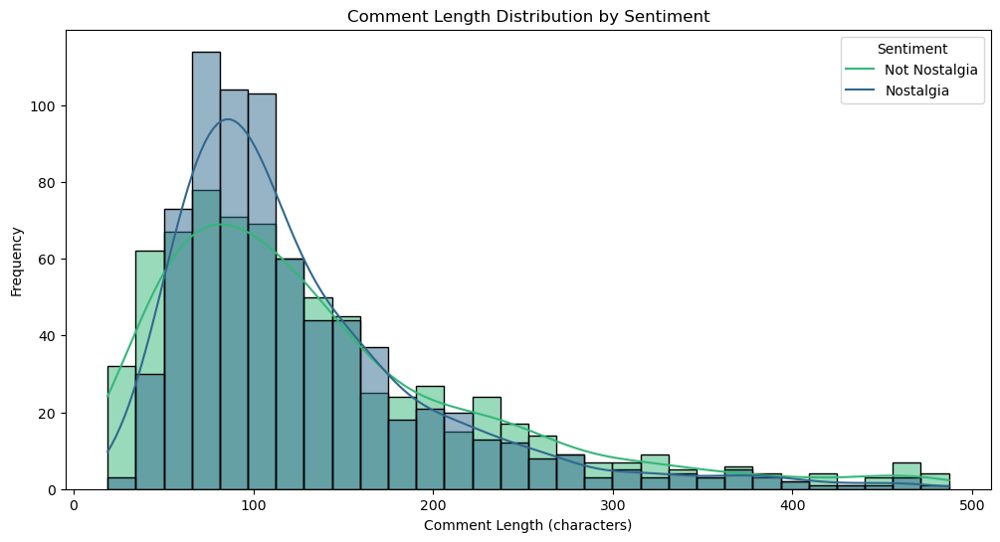

In [314]:
# Calculate the length of each comment in the 'comment' column
Y['comment_length'] = Y['comment'].apply(len)

# Set up the plotting style
plt.figure(figsize=(12, 6))
sns.histplot(data=Y, x='comment_length', hue='sentiment', bins=30, kde=True, palette="viridis")

# Add titles and labels
plt.title("Comment Length Distribution by Sentiment")
plt.xlabel("Comment Length (characters)")
plt.ylabel("Frequency")
plt.legend(title="Sentiment", labels=['Not Nostalgia', 'Nostalgia'])
plt.show()


The above histogram was plotted with the intention to determine whether comment length played a part in determining whether it was classified as nostalgic or not. As we can see from above, the most comment length for both sentiments are around 50-100 characters, with the highest frequency for both categories.

Though it may appear that comments with a nostalgic sentiment have a broader range with longer comment lengths, there is significant overlap in the distributions, suggesting that comment length may not be an important feature in disguishing between nostalgia from not nostalgia.

C:\Users\marcu\AppData\Local\Temp\ipykernel_22900\959209443.py:27: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.


C:\Users\marcu\AppData\Local\Temp\ipykernel_22900\959209443.py:34: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.




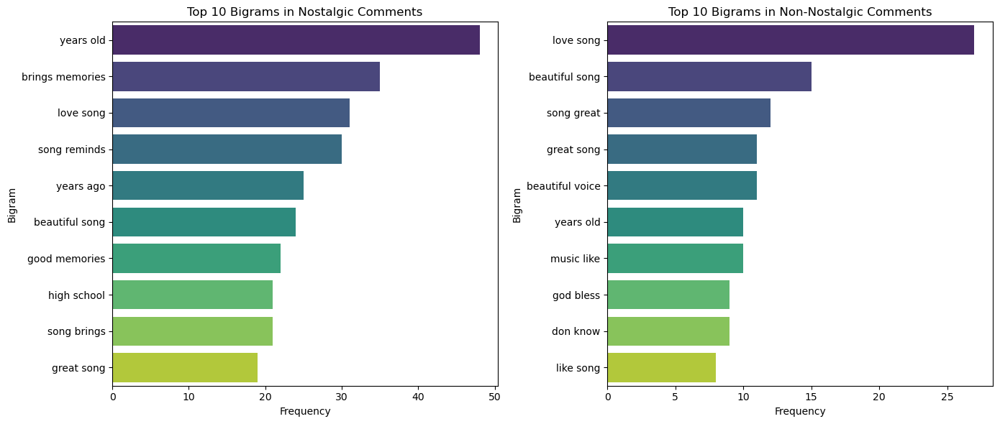

In [316]:
def get_top_ngrams(corpus, ngram_range=(2, 2), n=None):
    """Generate top n n-grams for a given corpus"""
    vectorizer = CountVectorizer(ngram_range=ngram_range, stop_words='english')
    X = vectorizer.fit_transform(corpus)
    sum_words = X.sum(axis=0) 
    words_freq = [(word, sum_words[0, idx]) for word, idx in vectorizer.vocabulary_.items()]
    words_freq = sorted(words_freq, key = lambda x: x[1], reverse=True)
    return words_freq[:n]

# Separate comments by sentiment
nostalgia_comments = Y[Y['sentiment'] == 'nostalgia']['comment']
not_nostalgia_comments = Y[Y['sentiment'] == 'not nostalgia']['comment']

# Get top 10 bigrams for each sentiment
top_bigrams_nostalgia = get_top_ngrams(nostalgia_comments, ngram_range=(2, 2), n=10)
top_bigrams_not_nostalgia = get_top_ngrams(not_nostalgia_comments, ngram_range=(2, 2), n=10)

# Convert the results to DataFrames for easier plotting
nostalgia_df = pd.DataFrame(top_bigrams_nostalgia, columns=['bigram', 'frequency'])
not_nostalgia_df = pd.DataFrame(top_bigrams_not_nostalgia, columns=['bigram', 'frequency'])

# Plotting the bigram frequencies
plt.figure(figsize=(14, 6))

# Nostalgia bigrams
plt.subplot(1, 2, 1)
sns.barplot(x='frequency', y='bigram', data=nostalgia_df, palette='viridis')
plt.title('Top 10 Bigrams in Nostalgic Comments')
plt.xlabel('Frequency')
plt.ylabel('Bigram')

# Not Nostalgia bigrams
plt.subplot(1, 2, 2)
sns.barplot(x='frequency', y='bigram', data=not_nostalgia_df, palette='viridis')
plt.title('Top 10 Bigrams in Non-Nostalgic Comments')
plt.xlabel('Frequency')
plt.ylabel('Bigram')

plt.tight_layout()
plt.show()

Instead of looking at unigrams as we have done, we can instead look at bigrams, which are pairs of consecutive written words in this context. We can clearly see from above that there are clear bigrams that would be used when describing or invoking nostalgic feelings such as 'brings memories', 'good memories' or 'song reminds', which are absent from the top bigrams in non-nostalgic comments.

## Inefficiencies and Improvements in Data preprocessing

There are several inefficiencies and places for improvements in the data preprocessing for both texts.

When doing sampling (i.e. X_sample), in the Lab it was shown that 1000 records were selected randomly. Though the proportion of all categories were relatively equal for both datasets and hence the sampled data was representative of the entire dataset, it is better to use stratified sampling in the future to maintain the same proportion of categories as in the full dataset.

In the Lab, we also only did feature creation using unigrams. Instead, we should use bigrams or trigrams as well to capture more context and semantic relationships (such as my bigram visualization directly above).

We also did a preliminary attribute transformation by summing up the frequencies of each word across all documents, but this is inefficient as document length can vary widely and it doesn't account for the distribution of terms within individual documents. Subsequently using TF-IDF on the new dataset helps to remedy the potential downside of this.



Separately, below are some notes on data cleaning as well where I have noticed ineffiencies and room for improvement:

As both datasets deal mainly with classifications for texts (emails and comments), a key step that was omitted would have to be text cleaning. This is particularly important for the initial 20 newsgroup datasets, as certain terms such as incoherent strings of numbers or various acronyms present in headers/email addresses have no bearing on the classification of the actual text. We should have performed basic text cleaning steps like lowercasing and removing punctuations, or even implementing nuanced cleaning techniques like lemmatization and handling contractions.

When we performed tokenization, it was also done using simple space-based methods where we should have instead used advanced tokenization methods via libraries such as SpaCy.

We could also have performed text length normalization on both datasets. As we can see from the histogram on the nostalgia dataset done above, comment lengths vary from the bulk at 50-100 to 300 and even 500 characters. Normalization or removing outliers could have helped with mitigating any potential bias that longer texts may have brought to improve the machine learning model performance overall.